<a href="https://colab.research.google.com/github/SenSudi/Smart-Water-Analytics/blob/main/LSTM_predictions1/6.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ***Acea Smart Water level prediction***

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as pl
from pylab import rcParams
import statsmodels.api as sm
import plotly.express as px
from datetime import date
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_absolute_error
import warnings
import numpy
import matplotlib.pyplot as plt
import pandas as pd
import math
import tensorflow as tf

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import Dropout
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error

import matplotlib.pylab as pylab
params = {'legend.fontsize': 'x-large',
          'figure.titlesize': 'x-large',
         'axes.labelsize': 'large',
         'axes.titlesize':'large',
         'xtick.labelsize':'large',
         'ytick.labelsize':'large'}

pylab.rcParams.update(params)
pl.rcParams.update({'font.size': 16})

print(tf.__version__)

warnings.filterwarnings("ignore")
 
plt.style.use('seaborn-whitegrid')

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


2.4.1


In [2]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [3]:
Aquifer_Auser = pd.read_csv('/content/gdrive/MyDrive/Aquifer_Auser.csv')
Aquifer_Doganella = pd.read_csv('/content/gdrive/MyDrive/Aquifer_Doganella.csv')
Aquifer_Luco = pd.read_csv('/content/gdrive/MyDrive/Aquifer_Luco.csv')
Aquifer_Petrignano = pd.read_csv('/content/gdrive/MyDrive/Aquifer_Petrignano.csv')
Lake_Bilancino = pd.read_csv('/content/gdrive/MyDrive/Lake_Bilancino.csv')
River_Arno  = pd.read_csv('/content/gdrive/MyDrive/River_Arno.csv')
Water_Spring_Amiata = pd.read_csv('/content/gdrive/MyDrive/Water_Spring_Amiata.csv')
Water_Spring_Lupa = pd.read_csv('/content/gdrive/MyDrive/Water_Spring_Lupa.csv')
Water_Spring_Madonna_di_Canneto = pd.read_csv('/content/gdrive/MyDrive/Water_Spring_Madonna_di_Canneto.csv')

Aquifer_Auser['Date'] = pd.to_datetime(Aquifer_Auser['Date'], dayfirst=True)
Aquifer_Doganella['Date'] = pd.to_datetime(Aquifer_Doganella['Date'], dayfirst=True)
Aquifer_Luco['Date'] = pd.to_datetime(Aquifer_Luco['Date'], dayfirst=True)
Aquifer_Petrignano['Date'] = pd.to_datetime(Aquifer_Petrignano['Date'], dayfirst=True)
Lake_Bilancino['Date'] = pd.to_datetime(Lake_Bilancino['Date'], dayfirst=True)
River_Arno['Date'] = pd.to_datetime(River_Arno['Date'], dayfirst=True)
Water_Spring_Amiata['Date'] = pd.to_datetime(Water_Spring_Amiata['Date'], dayfirst=True)
Water_Spring_Lupa['Date'] = pd.to_datetime(Water_Spring_Lupa['Date'], dayfirst=True)
Water_Spring_Madonna_di_Canneto['Date'] = pd.to_datetime(Water_Spring_Madonna_di_Canneto['Date'], dayfirst=True)

Aquifer_Auser_target = ['Depth_to_Groundwater_SAL', 'Depth_to_Groundwater_CoS', 'Depth_to_Groundwater_LT2']       # list of target column names
Aquifer_Doganella_target = ['Depth_to_Groundwater_Pozzo_1', 'Depth_to_Groundwater_Pozzo_2','Depth_to_Groundwater_Pozzo_3', 'Depth_to_Groundwater_Pozzo_4','Depth_to_Groundwater_Pozzo_5', 'Depth_to_Groundwater_Pozzo_6','Depth_to_Groundwater_Pozzo_7', 'Depth_to_Groundwater_Pozzo_8','Depth_to_Groundwater_Pozzo_9']
Aquifer_Luco_target = ['Depth_to_Groundwater_Podere_Casetta']
Aquifer_Petrignano_target = ['Depth_to_Groundwater_P24', 'Depth_to_Groundwater_P25']
Lake_Bilancino_target = ['Lake_Level', 'Flow_Rate']
River_Arno_target = ['Hydrometry_Nave_di_Rosano']
Water_Spring_Amiata_target = ['Flow_Rate_Bugnano', 'Flow_Rate_Arbure', 'Flow_Rate_Ermicciolo', 'Flow_Rate_Galleria_Alta']
Water_Spring_Lupa_target = ['Flow_Rate_Lupa']
Water_Spring_Madonna_di_Canneto_target = ['Flow_Rate_Madonna_di_Canneto']

dataset = ['Aquifer_Auser','Aquifer_Doganella','Aquifer_Luco','Aquifer_Petrignano','Lake_Bilancino','River_Arno','Water_Spring_Amiata','Water_Spring_Lupa','Water_Spring_Madonna_di_Canneto']
all_data = [Aquifer_Auser,Aquifer_Doganella,Aquifer_Luco,Aquifer_Petrignano,Lake_Bilancino,River_Arno,Water_Spring_Amiata,Water_Spring_Lupa,Water_Spring_Madonna_di_Canneto] # list of data frame
all_data_target = [Aquifer_Auser_target,Aquifer_Doganella_target,Aquifer_Luco_target,Aquifer_Petrignano_target,Lake_Bilancino_target,River_Arno_target,Water_Spring_Amiata_target,Water_Spring_Lupa_target,Water_Spring_Madonna_di_Canneto_target]

# Dataset Overview

In [4]:
import itertools
ab = itertools.chain(col for col in all_data_target)
all = list(ab)
all_targets = [item for sublist in all for item in sublist]
all_targets

['Depth_to_Groundwater_SAL',
 'Depth_to_Groundwater_CoS',
 'Depth_to_Groundwater_LT2',
 'Depth_to_Groundwater_Pozzo_1',
 'Depth_to_Groundwater_Pozzo_2',
 'Depth_to_Groundwater_Pozzo_3',
 'Depth_to_Groundwater_Pozzo_4',
 'Depth_to_Groundwater_Pozzo_5',
 'Depth_to_Groundwater_Pozzo_6',
 'Depth_to_Groundwater_Pozzo_7',
 'Depth_to_Groundwater_Pozzo_8',
 'Depth_to_Groundwater_Pozzo_9',
 'Depth_to_Groundwater_Podere_Casetta',
 'Depth_to_Groundwater_P24',
 'Depth_to_Groundwater_P25',
 'Lake_Level',
 'Flow_Rate',
 'Hydrometry_Nave_di_Rosano',
 'Flow_Rate_Bugnano',
 'Flow_Rate_Arbure',
 'Flow_Rate_Ermicciolo',
 'Flow_Rate_Galleria_Alta',
 'Flow_Rate_Lupa',
 'Flow_Rate_Madonna_di_Canneto']

In [5]:
# Since flow rate cannot be negative, but negative values might show up sometimes due to faulty sensors.
# Company wants us to use the  
# Hence we consider only abs() values

Lake_Bilancino['Flow_Rate'] = Lake_Bilancino['Flow_Rate'].abs()    
Water_Spring_Amiata['Flow_Rate_Bugnano'] = Water_Spring_Amiata['Flow_Rate_Bugnano'].abs() 
Water_Spring_Amiata['Flow_Rate_Arbure'] = Water_Spring_Amiata['Flow_Rate_Arbure'].abs()
Water_Spring_Amiata['Flow_Rate_Ermicciolo'] = Water_Spring_Amiata['Flow_Rate_Ermicciolo'].abs()
Water_Spring_Amiata['Depth_to_Groundwater_David_Lazzaretti'] = Water_Spring_Amiata['Depth_to_Groundwater_David_Lazzaretti'].abs()
Water_Spring_Amiata['Flow_Rate_Galleria_Alta'] = Water_Spring_Amiata['Flow_Rate_Galleria_Alta'].abs()
Water_Spring_Lupa['Flow_Rate_Lupa'] = Water_Spring_Lupa['Flow_Rate_Lupa'].abs()
Water_Spring_Madonna_di_Canneto['Flow_Rate_Madonna_di_Canneto'] = Water_Spring_Madonna_di_Canneto['Flow_Rate_Madonna_di_Canneto'].abs()

Box plot and Null values graph function

In [6]:
#using box

def box_plot(acea_df,acea_df_target):
  acea_df.replace(0, np.nan, inplace=True)                                     # replacing NAN values temporaily with zeros
  acea_df.dropna(subset=['Date'],inplace=True)                                 # dropping date column since not important for box plot
  acea_df['year'] = [d.year for d in acea_df.Date]                             # created new column - year for plotting, and hopefully we'll find some seasonailty/trends
  acea_df['month'] = [d.strftime('%b') for d in acea_df.Date]                  # for monthwise plots
  years = acea_df['year'].unique()
  for target in acea_df_target:
    fig, axes = plt.subplots(1, 2, figsize=(20,7), dpi= 80)
    sns.boxplot(x='year', y=target, data=acea_df, ax=axes[0])
    sns.boxplot(x='month', y=target, data=acea_df.loc[~acea_df.year.isin([1998, 2020]), :])
    # Set Title
    axes[0].set_title('Year-wise Box Plot\n(The Trend)', fontsize=18); 
    axes[1].set_title('Month-wise Box Plot\n(The Seasonality)', fontsize=18)
    plt.show()
  return acea_df

def nagraph(name,acea_df):
    f, ax = plt.subplots(nrows=1, ncols=1, figsize=(40,20))
    sns.heatmap(acea_df.T.isna(), cmap='Blues') # transforming for landscape view
    ax.set_title("Missing Values for "+name, fontsize=20)
    plt.show()

Exploring the data

In [7]:
Aquifer_Auser = Aquifer_Auser.sort_values(by='Date')

# Check time intervals
Aquifer_Auser['Time_Interval'] = Aquifer_Auser.Date - Aquifer_Auser.Date.shift(1)

Aquifer_Auser[['Date', 'Time_Interval']].head()

,Date,Time_Interval
0,1998-03-05,NaT
1,1998-03-06,1 days
2,1998-03-07,1 days
3,1998-03-08,1 days
4,1998-03-09,1 days


# Aquifers and Wells

Independent Attributes

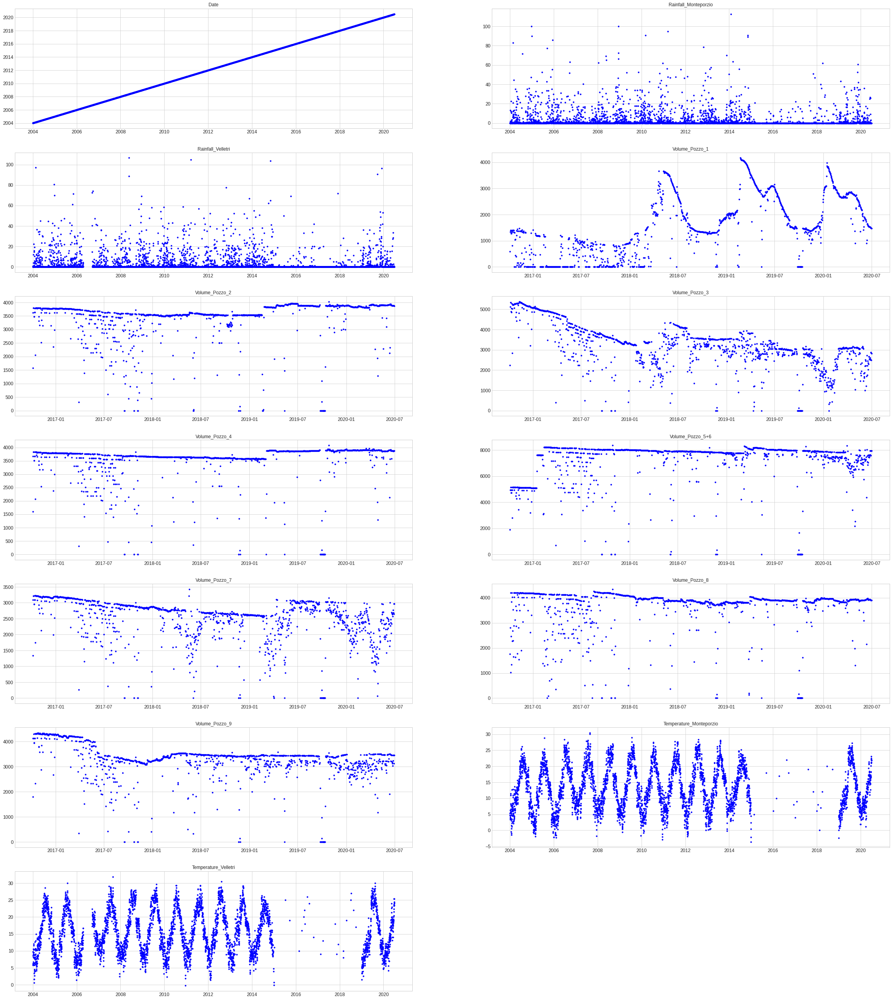

In [8]:
plt.figure(figsize=(40,100))
i=0
# independent columns vs year
for col in all_data[1].columns:
  if col not in all_data_target[1]:
      plt.subplot(15,2, i+1)
      plt.plot(all_data[1].Date,all_data[1][col],'b.')
      plt.title(col)
      i=i+1
plt.show()

Target Attributes

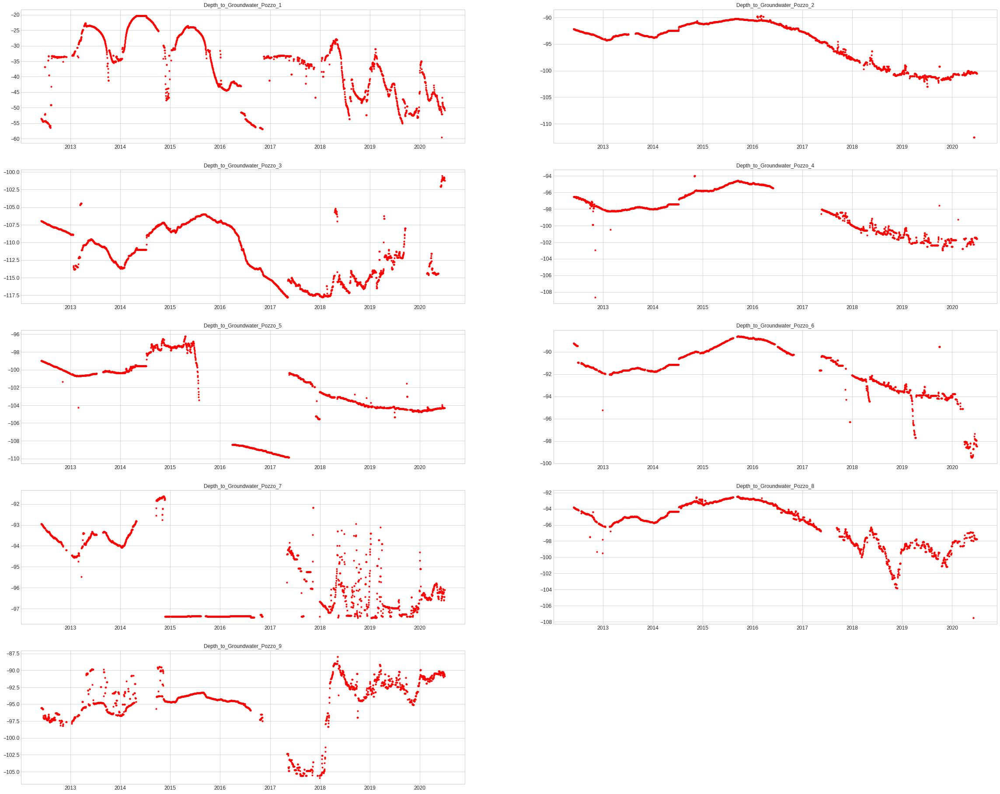

In [9]:
plt.figure(figsize=(40,100))
for i,col in enumerate(all_data_target[1]):
  plt.subplot(15,2, i+1)
  plt.plot(all_data[1].Date,all_data[1][col],'r.')
  plt.title(col)
plt.show()

Dataset Name -  Aquifer_Auser
Target Attributes -  ['Depth_to_Groundwater_SAL', 'Depth_to_Groundwater_CoS', 'Depth_to_Groundwater_LT2']
       Rainfall_Gallicano  ...  Hydrometry_Piaggione
count         5295.000000  ...           6119.000000
mean             4.948782  ...             -0.209204
std             14.366480  ...              0.849013
min              0.000000  ...             -1.190000
25%              0.000000  ...             -1.000000
50%              0.000000  ...             -0.280000
75%              2.000000  ...              0.580000
max            318.800000  ...              3.690000

[8 rows x 26 columns]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8154 entries, 0 to 8153
Data columns (total 27 columns):
 #   Column                                   Non-Null Count  Dtype         
---  ------                                   --------------  -----         
 0   Date                                     8154 non-null   datetime64[ns]
 1   Rainfall_Gallicano   

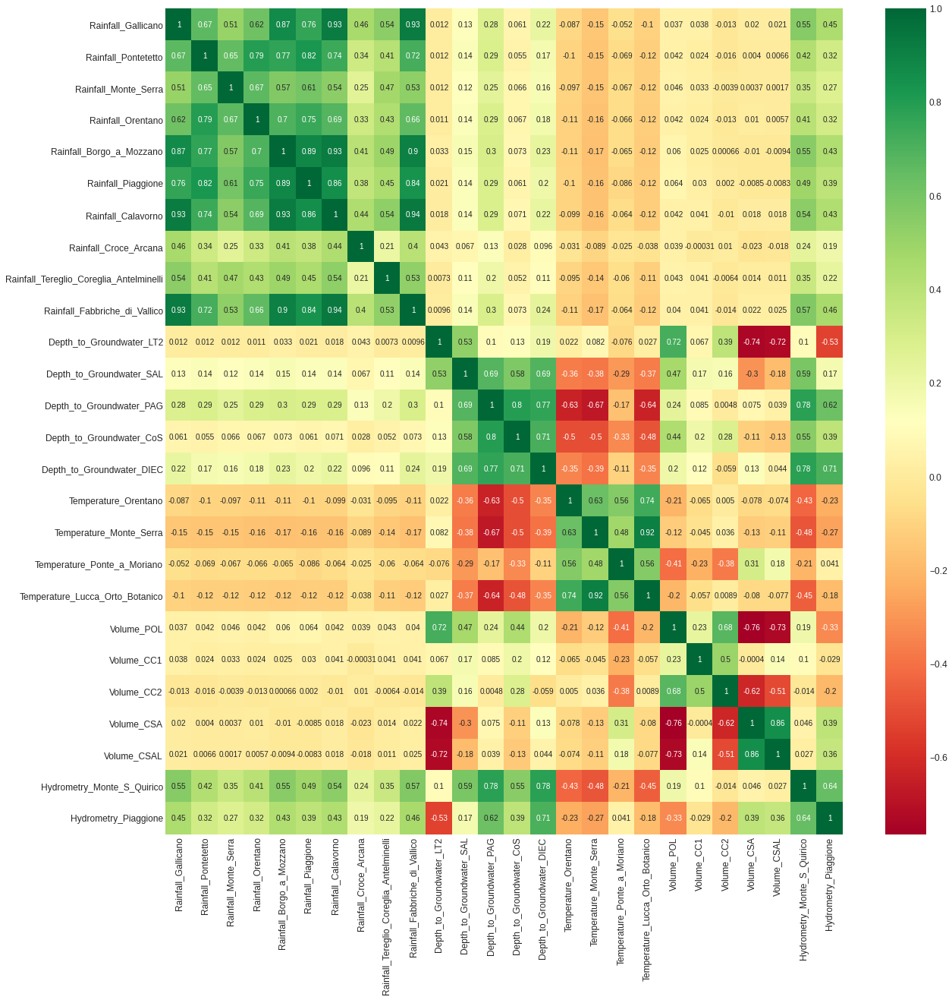

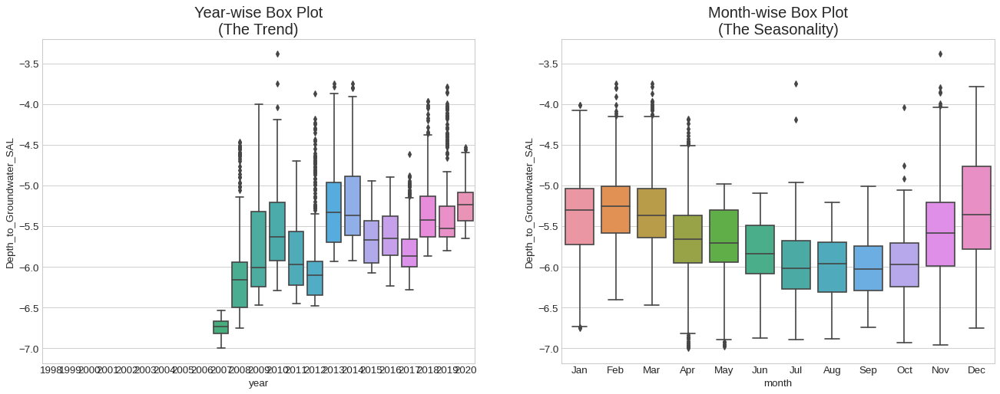

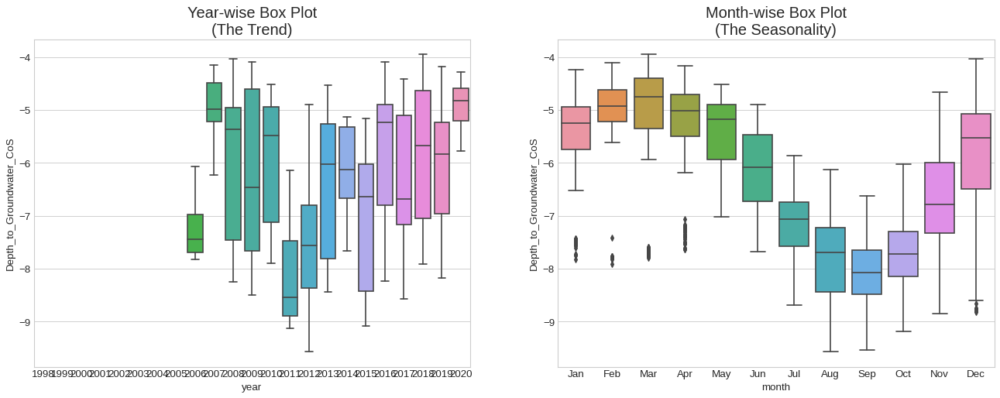

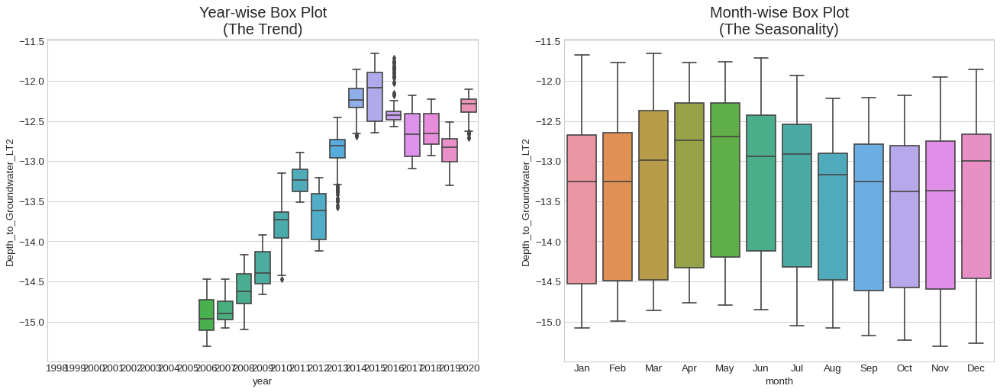

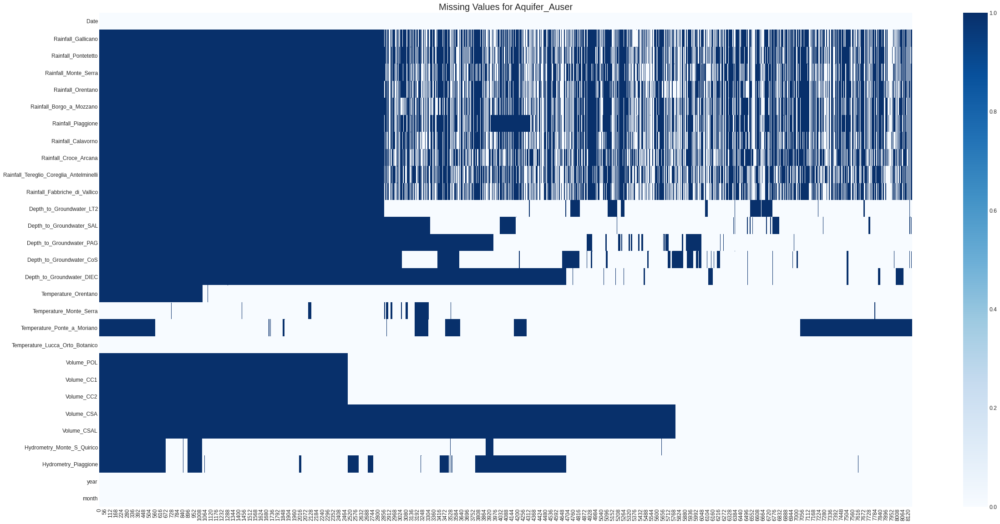

Dataset Name -  Aquifer_Doganella
Target Attributes -  ['Depth_to_Groundwater_Pozzo_1', 'Depth_to_Groundwater_Pozzo_2', 'Depth_to_Groundwater_Pozzo_3', 'Depth_to_Groundwater_Pozzo_4', 'Depth_to_Groundwater_Pozzo_5', 'Depth_to_Groundwater_Pozzo_6', 'Depth_to_Groundwater_Pozzo_7', 'Depth_to_Groundwater_Pozzo_8', 'Depth_to_Groundwater_Pozzo_9']
       Rainfall_Monteporzio  ...  Temperature_Velletri
count           5399.000000  ...           4383.000000
mean               2.893758  ...             15.574038
std                8.624455  ...              6.352674
min                0.000000  ...             -0.270000
25%                0.000000  ...             10.365000
50%                0.000000  ...             15.150000
75%                0.600000  ...             20.725000
max              112.600000  ...             31.900000

[8 rows x 21 columns]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6026 entries, 0 to 6025
Data columns (total 22 columns):
 #   Column                    

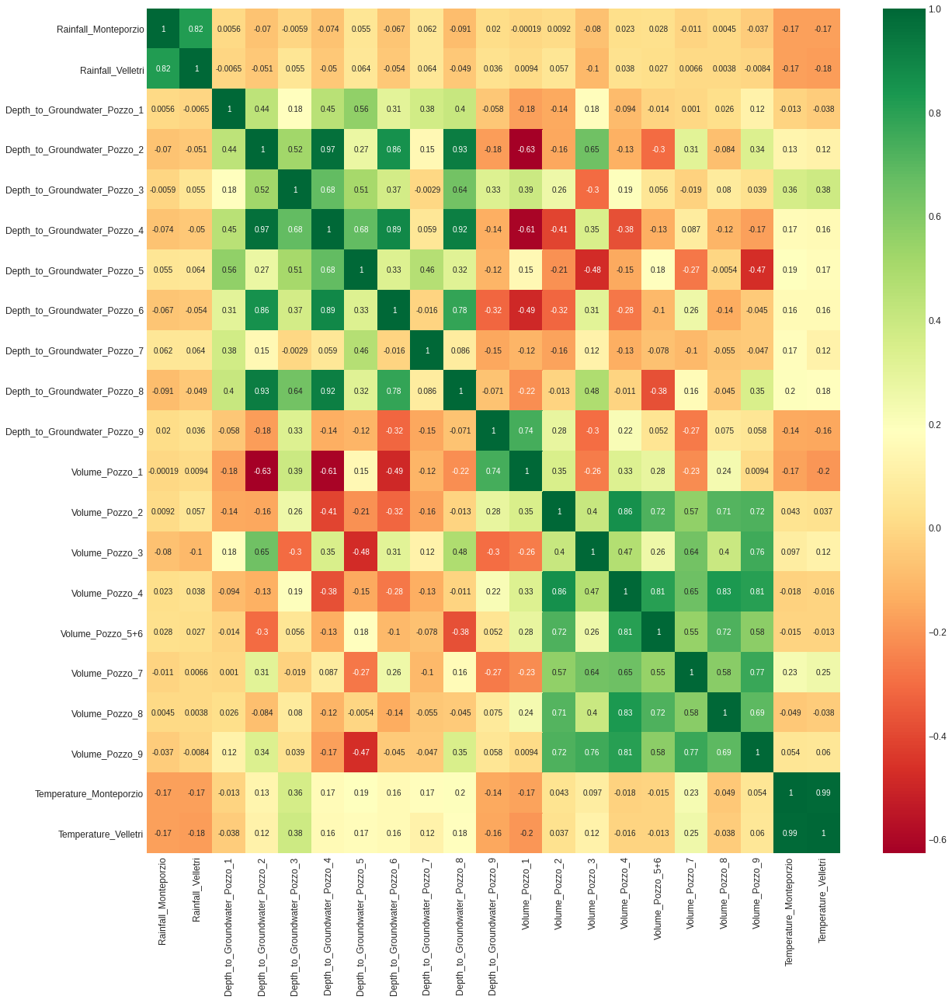

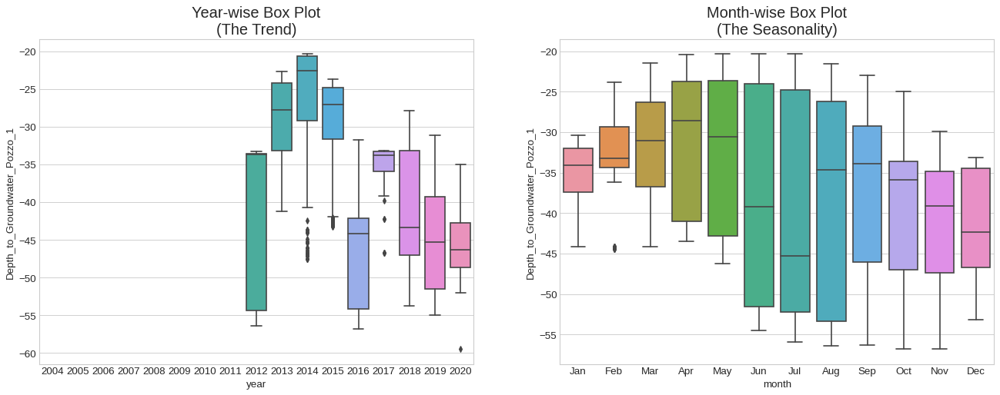

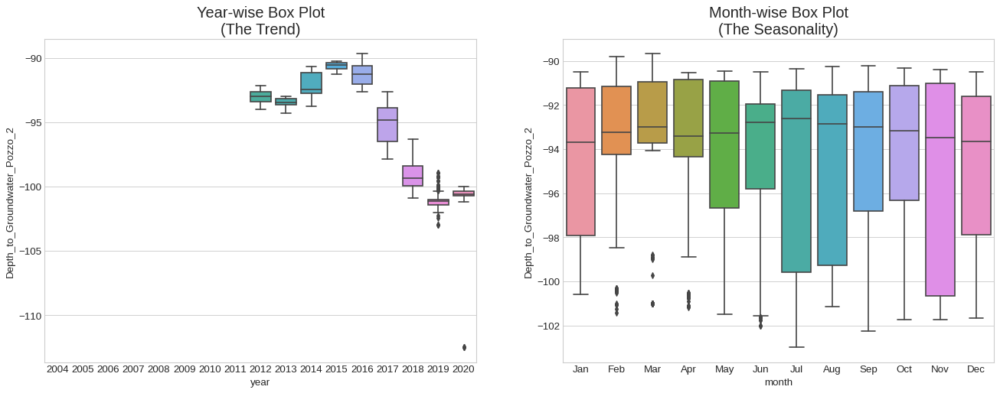

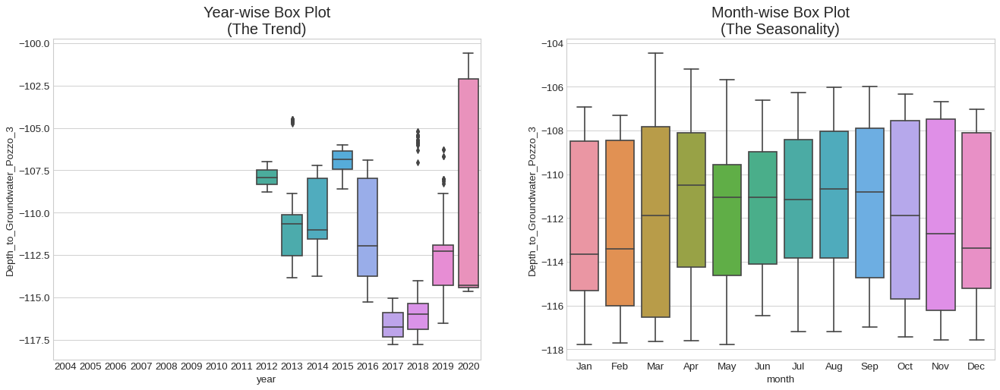

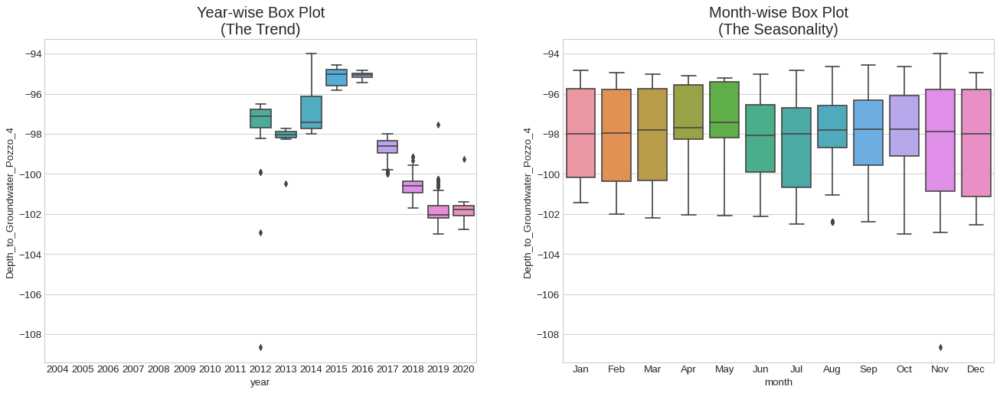

...

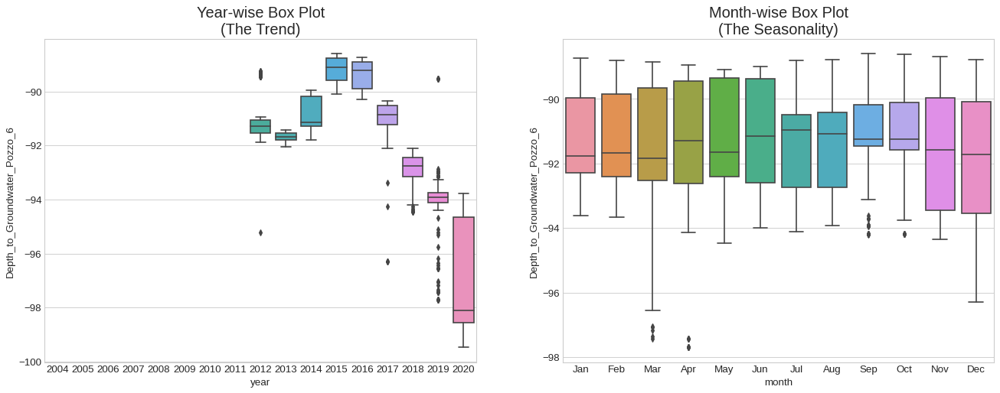

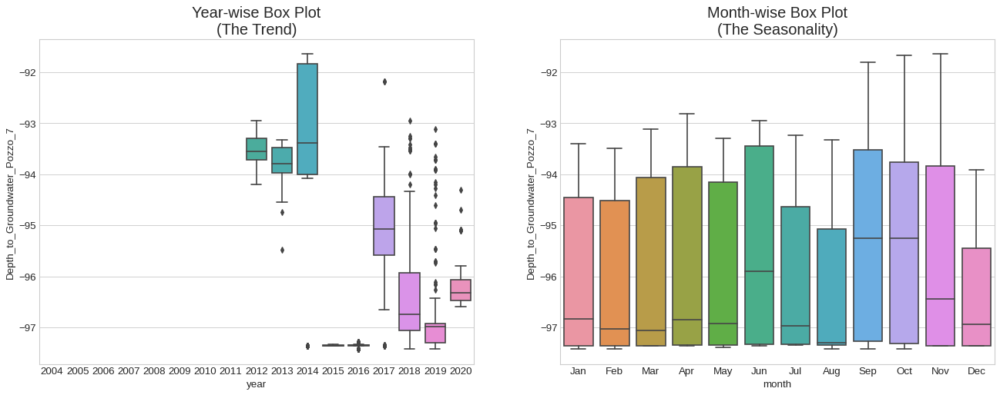

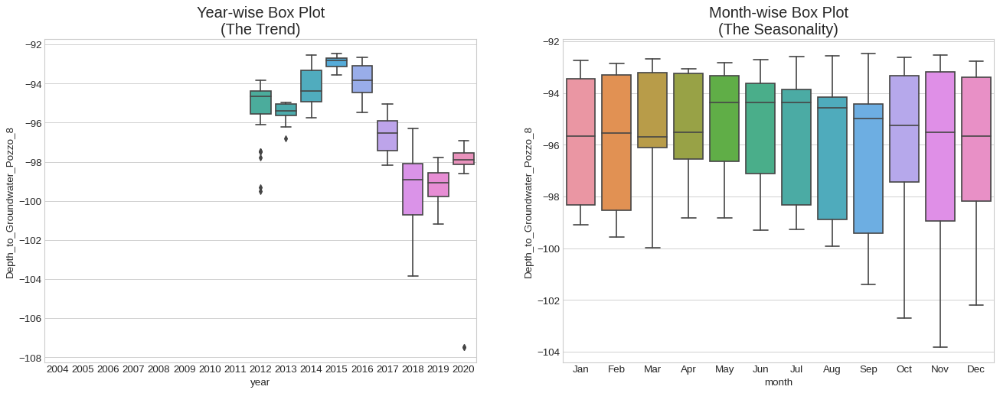

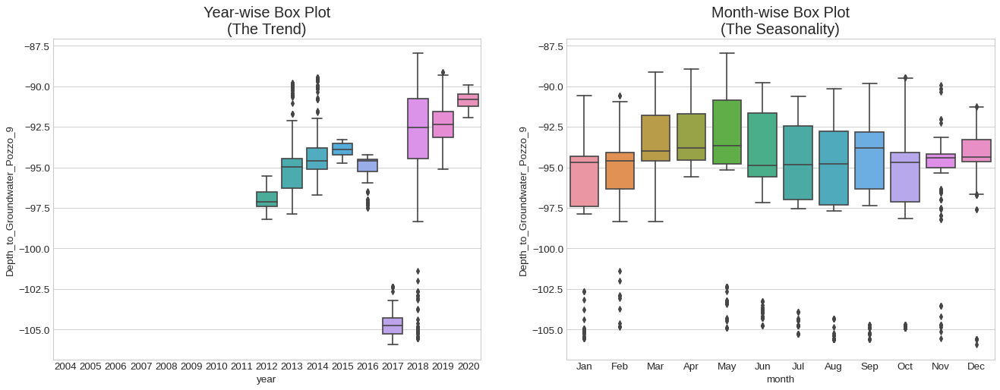

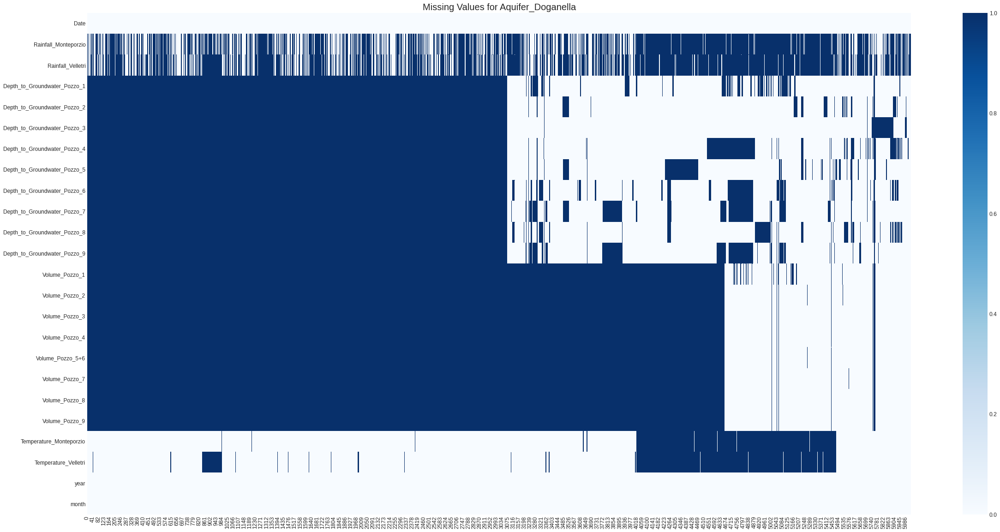

Dataset Name -  Aquifer_Luco
Target Attributes -  ['Depth_to_Groundwater_Podere_Casetta']
       Rainfall_Simignano  ...  Volume_Pozzo_4
count          6822.00000  ...     2008.000000
mean              2.52146  ...     -135.214663
std               7.09014  ...       56.818120
min               0.00000  ...     -237.336612
25%               0.00000  ...     -175.177124
50%               0.00000  ...     -145.845891
75%               0.60000  ...      -96.849815
max              87.80000  ...       -0.053438

[8 rows x 21 columns]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7487 entries, 0 to 7486
Data columns (total 22 columns):
 #   Column                               Non-Null Count  Dtype         
---  ------                               --------------  -----         
 0   Date                                 7487 non-null   datetime64[ns]
 1   Rainfall_Simignano                   6822 non-null   float64       
 2   Rainfall_Siena_Poggio_al_Vento       951 non-null    float64

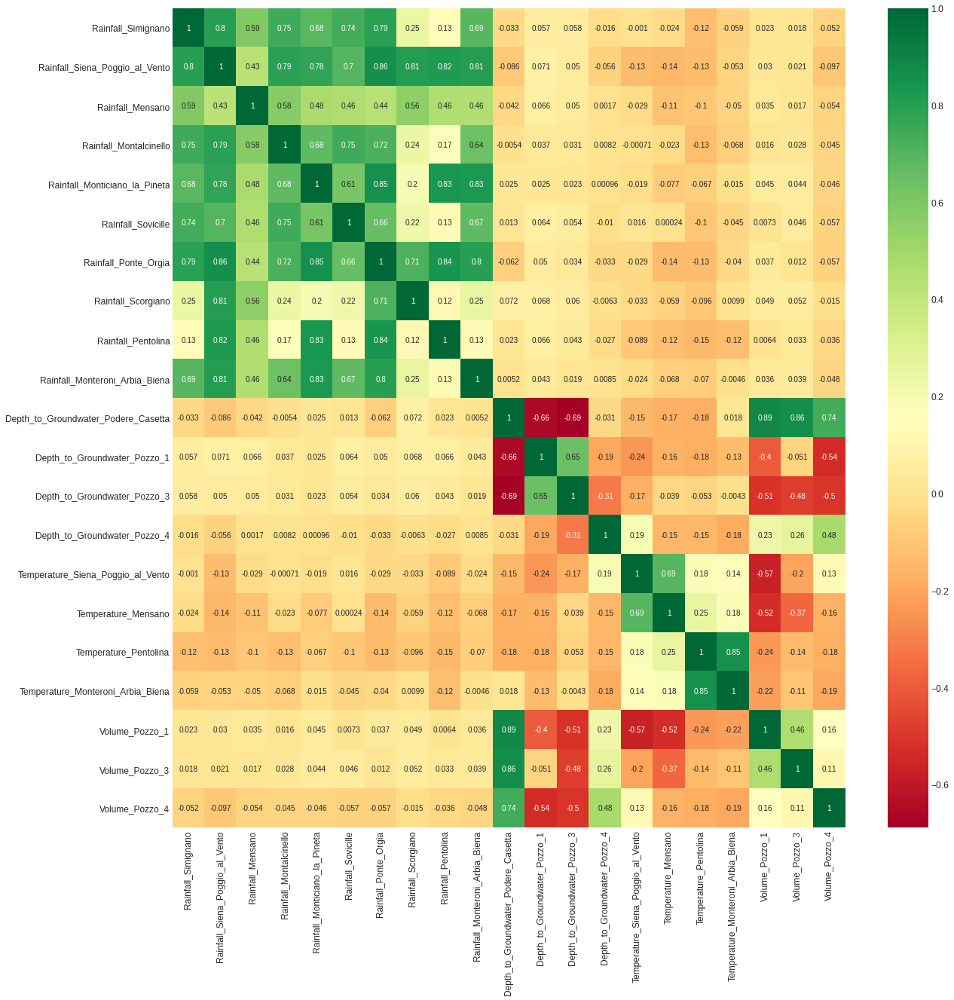

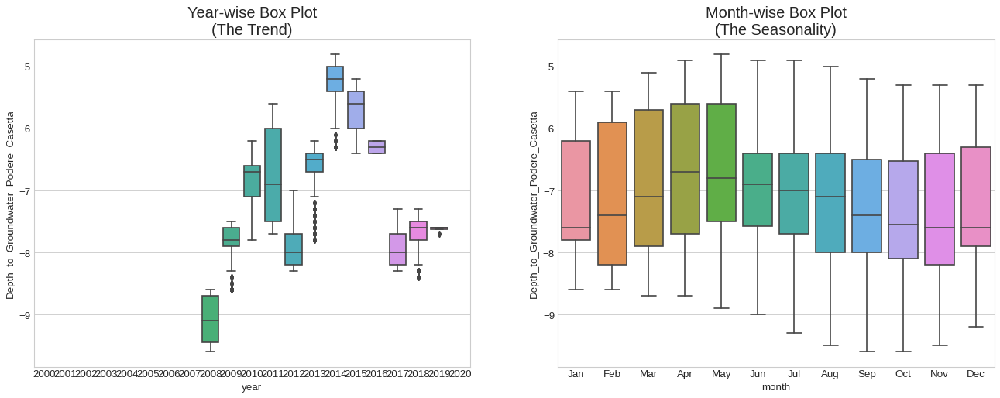

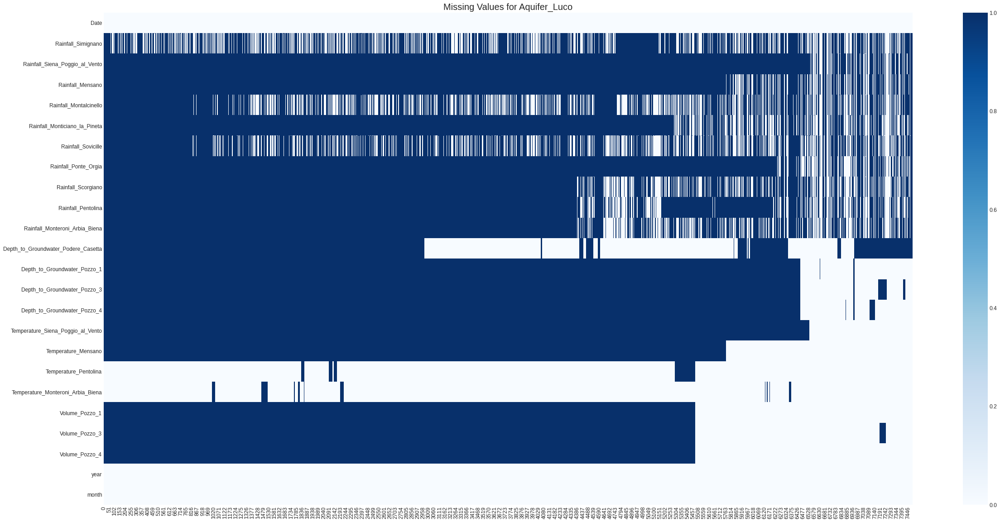

Dataset Name -  Aquifer_Petrignano
Target Attributes -  ['Depth_to_Groundwater_P24', 'Depth_to_Groundwater_P25']
       Rainfall_Bastia_Umbra  ...  Hydrometry_Fiume_Chiascio_Petrignano
count            4199.000000  ...                           4199.000000
mean                1.556633  ...                              2.372517
std                 5.217923  ...                              0.589088
min                 0.000000  ...                              0.000000
25%                 0.000000  ...                              2.100000
50%                 0.000000  ...                              2.400000
75%                 0.100000  ...                              2.700000
max                67.300000  ...                              4.100000

[8 rows x 7 columns]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5223 entries, 0 to 5222
Data columns (total 8 columns):
 #   Column                                Non-Null Count  Dtype         
---  ------                          

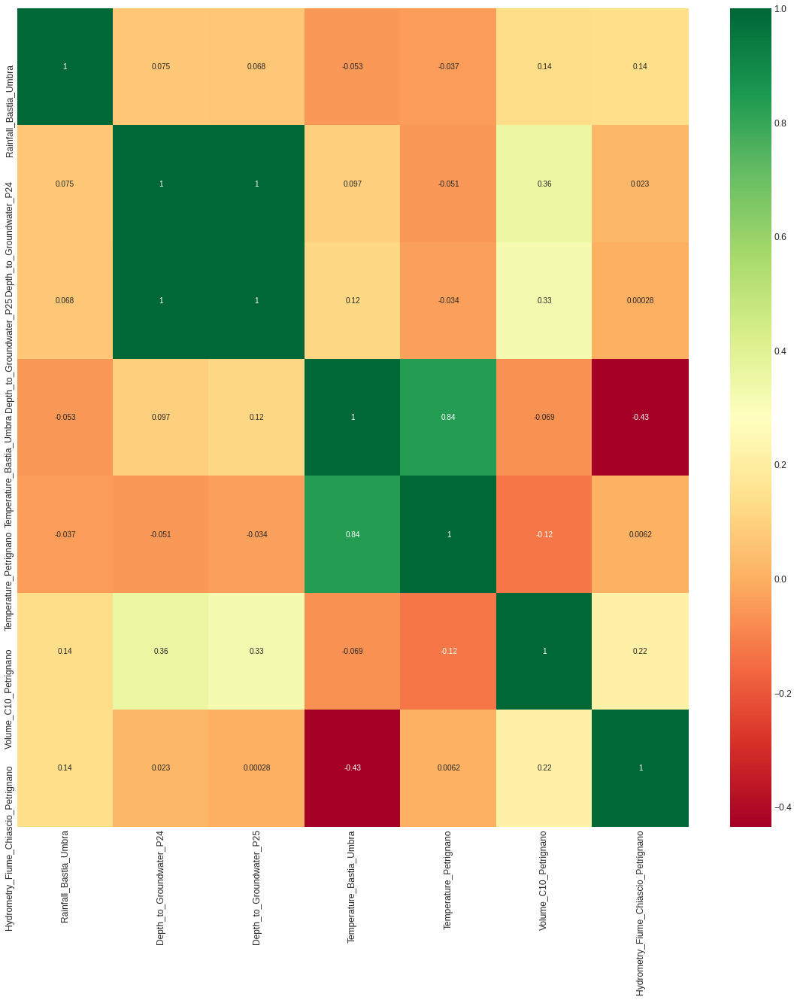

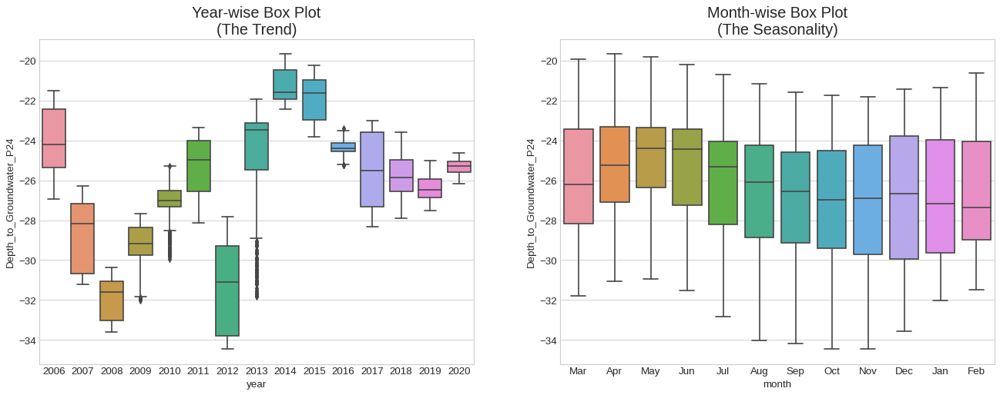

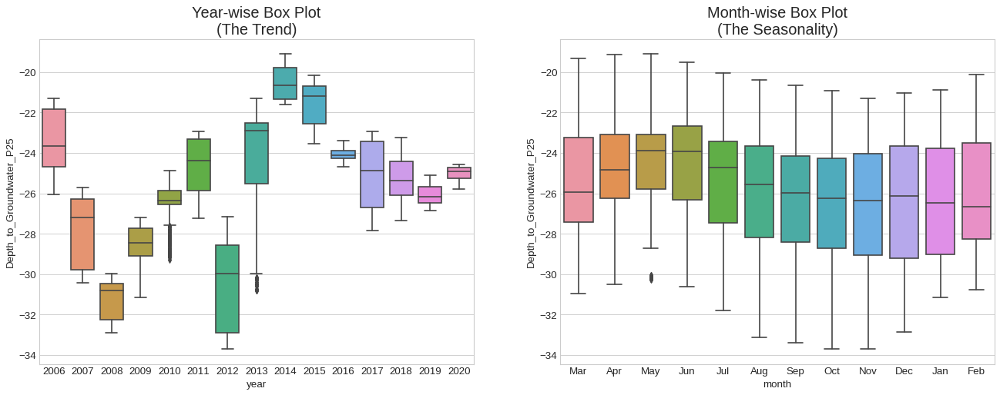

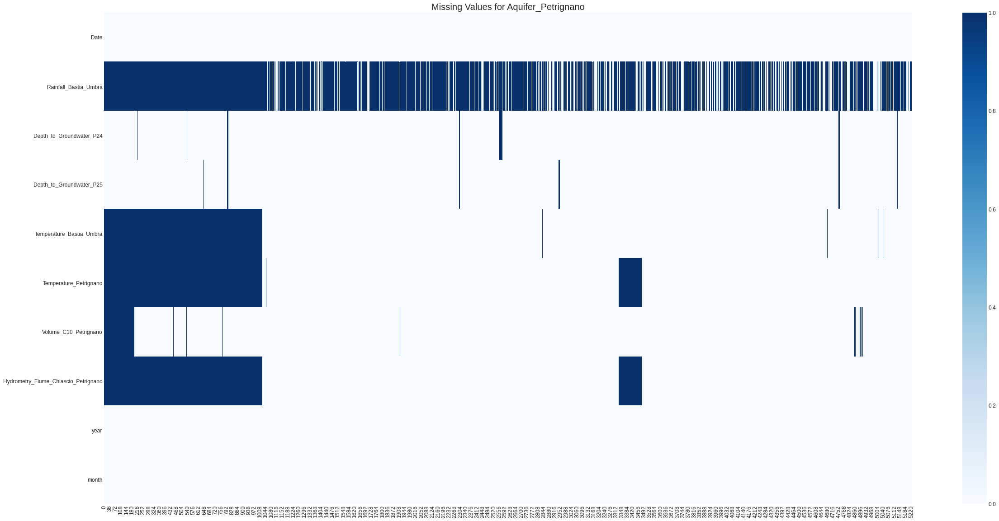

In [10]:
for i in range(0,4):
  print("Dataset Name - ",dataset[i])
  print("Target Attributes - ",all_data_target[i])
  print(all_data[i].describe())
  print(all_data[i].info())
  
  #Correlation Matrix
  corrmat = all_data[i].corr()
  top_corr_features = corrmat.index
  plt.figure(figsize=(20,20))

  #plot heat map
  g=sns.heatmap(all_data[i][top_corr_features].corr(),annot=True,cmap="RdYlGn")
  plt.plot()

  #Box plot for Dependent Attributes
  all_data[i] = box_plot(all_data[i],all_data_target[i])
  plt.show()

  ## Null Values
  nagraph(dataset[i],all_data[i])

**Observations -**

1. Volumes of rainfall are quite volatile both across locations and at different times of the year. However, we cannot observe apparent seasonal patterns.

2. Volume of most of the wells of Pozzo are mostly constant with some fluctuations. Volume of Pozzo_1 and Pozzo_2 are quite volatile at different times of the year.

3. Temperatures seems mostly between 0°C and 30°C. In addition, the temperature shows a quite strong annual cycle.

4. Most of the target attributes are not following a pattern and some of them have drastic drops in data which is either missing data or some man-made reasons.

5. From Boxplots it is observed that Dependent attributes characterise partial seasonality.

6. From the missing values graph it can be observed that half of the values related to Depth_to_groundwater columns are having null values.



# Lake Waterbody
```



Independent Attributes



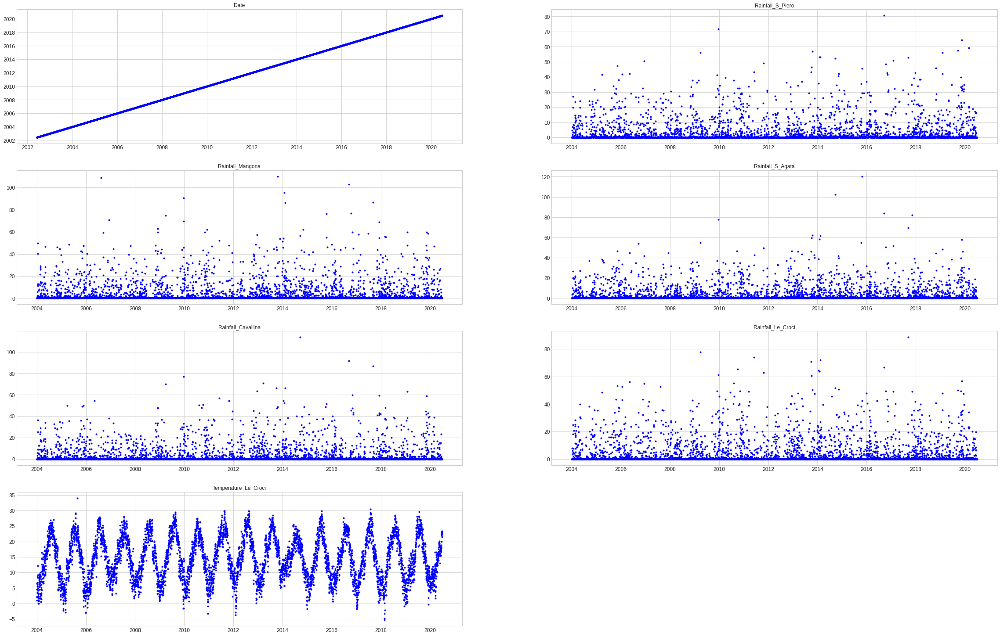

In [11]:
plt.figure(figsize=(40,100))
i=0
for col in all_data[4].columns:
  if col not in all_data_target[4]:
      plt.subplot(15,2, i+1)
      plt.plot(all_data[4].Date,all_data[4][col],'b.')
      plt.title(col)
      i=i+1
plt.show()

Target Attributes

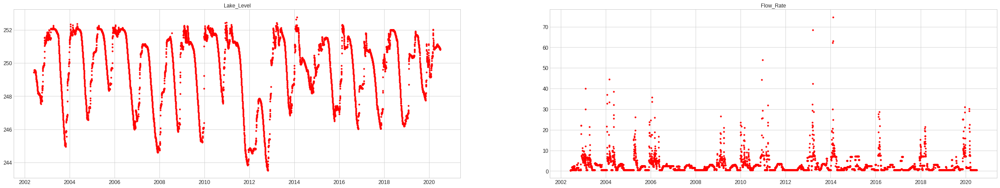

In [12]:
plt.figure(figsize=(40,100))
for i,col in enumerate(all_data_target[4]):
  plt.subplot(12,2, i+1)
  plt.plot(all_data[4].Date,all_data[4][col],'r.')
  plt.title(col)
plt.show()

for i in range(4,5):
  print("Dataset Name - ",dataset[i])
  print("Target Attributes - ",all_data_target[i])
  print(all_data[0].describe())
  print(all_data[0].info())
  
  corrmat = all_data[i].corr()
  top_corr_features = corrmat.index
  plt.figure(figsize=(20,20))
  #plot heat map
  g=sns.heatmap(all_data[i][top_corr_features].corr(),annot=True,cmap="RdYlGn")
  plt.plot()
  all_data[i] = box_plot(all_data[i],all_data_target[i])
  plt.show()
  nagraph(dataset[i],all_data[i])

In [13]:
Aquifer_Auser = Aquifer_Auser.sort_values(by='Date')

# Check time intervals
Aquifer_Auser['Time_Interval'] = Aquifer_Auser.Date - Aquifer_Auser.Date.shift(1)

Aquifer_Auser[['Date', 'Time_Interval']].head()

,Date,Time_Interval
0,1998-03-05,NaT
1,1998-03-06,1 days
2,1998-03-07,1 days
3,1998-03-08,1 days
4,1998-03-09,1 days


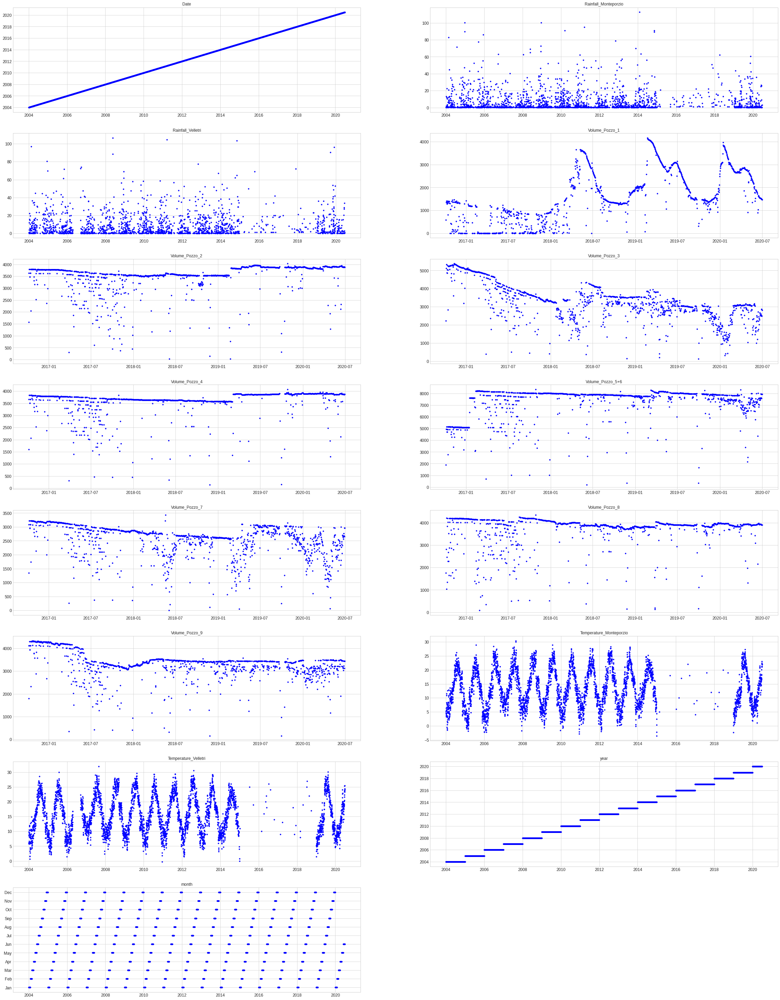

In [14]:
plt.figure(figsize=(40,100))
i=0
for col in all_data[1].columns:
  if col not in all_data_target[1]:
      plt.subplot(15,2, i+1)
      plt.plot(all_data[1].Date,all_data[1][col],'b.')
      plt.title(col)
      i=i+1
plt.show()

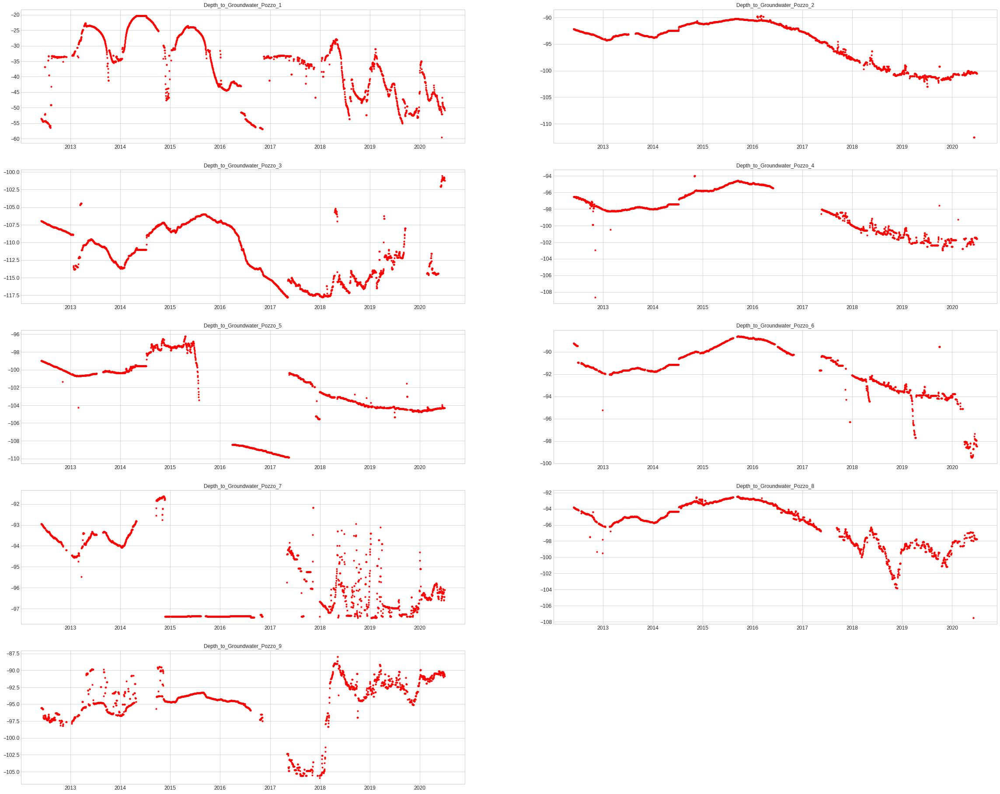

In [15]:
plt.figure(figsize=(40,100))
for i,col in enumerate(all_data_target[1]):
  plt.subplot(15,2, i+1)
  plt.plot(all_data[1].Date,all_data[1][col],'r.')
  plt.title(col)
plt.show()

Dataset Name -  Aquifer_Auser
Target Attributes -  ['Depth_to_Groundwater_SAL', 'Depth_to_Groundwater_CoS', 'Depth_to_Groundwater_LT2']
       Rainfall_Gallicano  ...         year
count         2085.000000  ...  8154.000000
mean            12.567770  ...  2008.837503
std             20.700458  ...     6.453598
min              0.200000  ...  1998.000000
25%              0.800000  ...  2003.000000
50%              4.400000  ...  2009.000000
75%             16.000000  ...  2014.000000
max            318.800000  ...  2020.000000

[8 rows x 27 columns]
<class 'pandas.core.frame.DataFrame'>
Int64Index: 8154 entries, 0 to 8153
Data columns (total 29 columns):
 #   Column                                   Non-Null Count  Dtype         
---  ------                                   --------------  -----         
 0   Date                                     8154 non-null   datetime64[ns]
 1   Rainfall_Gallicano                       2085 non-null   float64       
 2   Rainfall_Pontetetto      

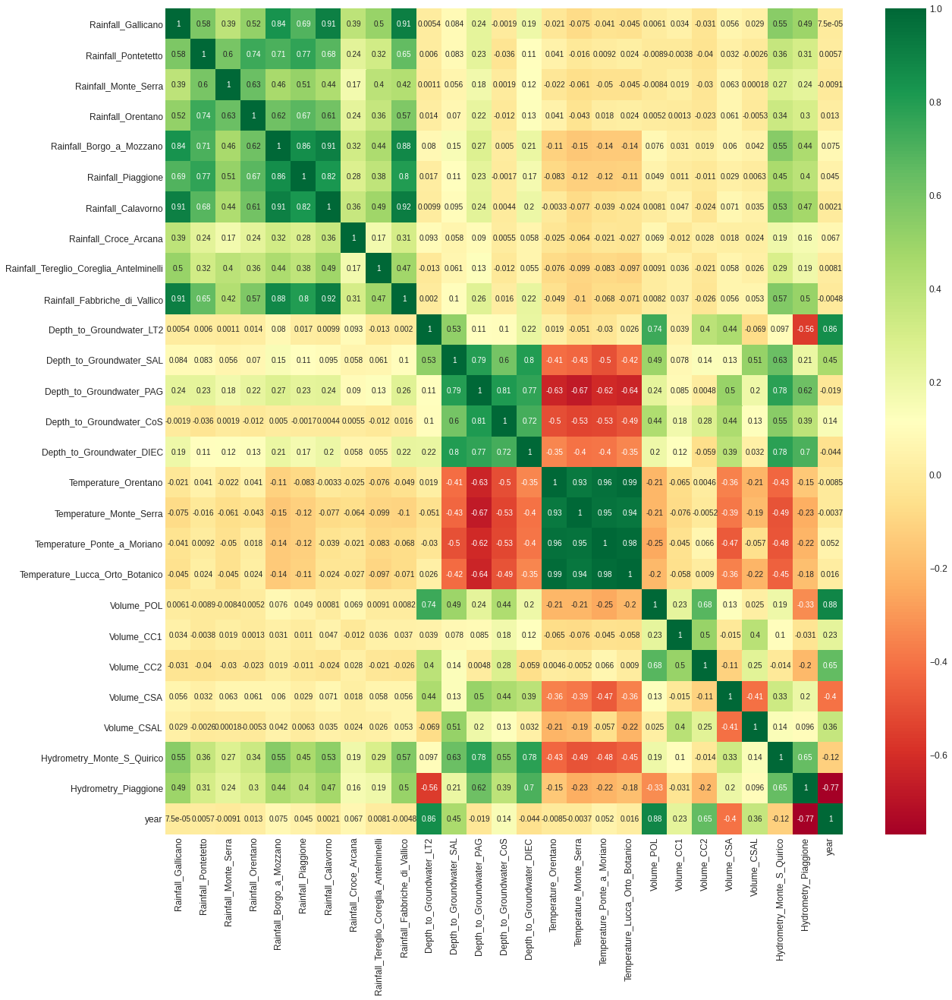

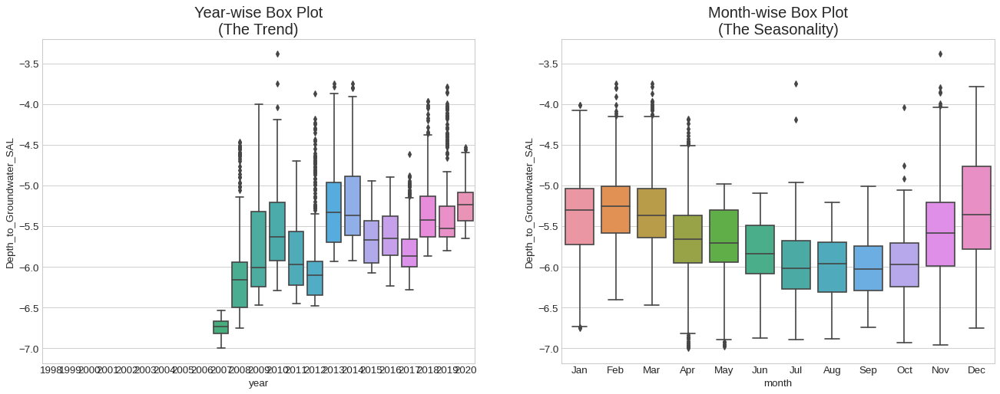

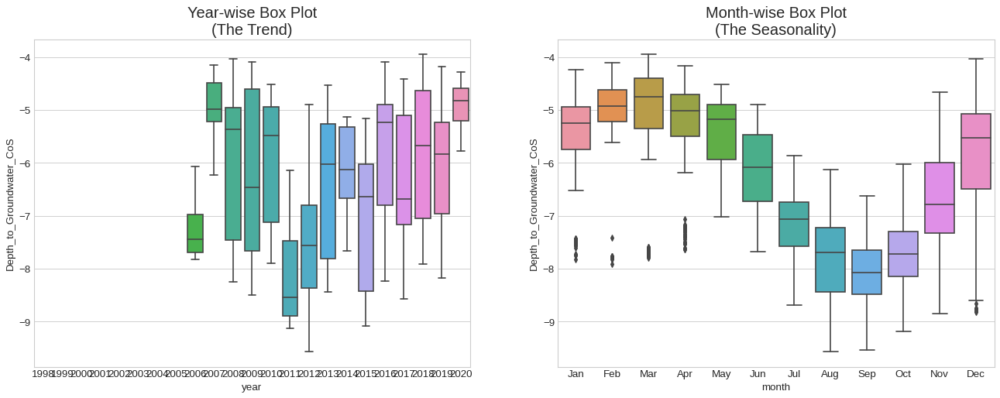

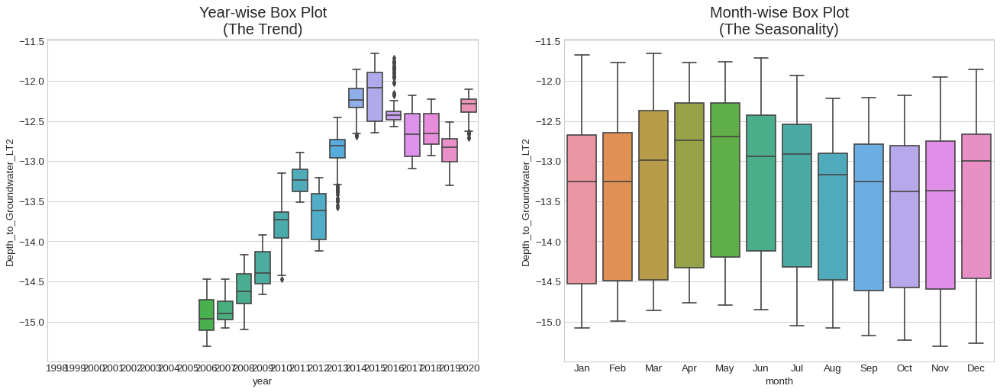

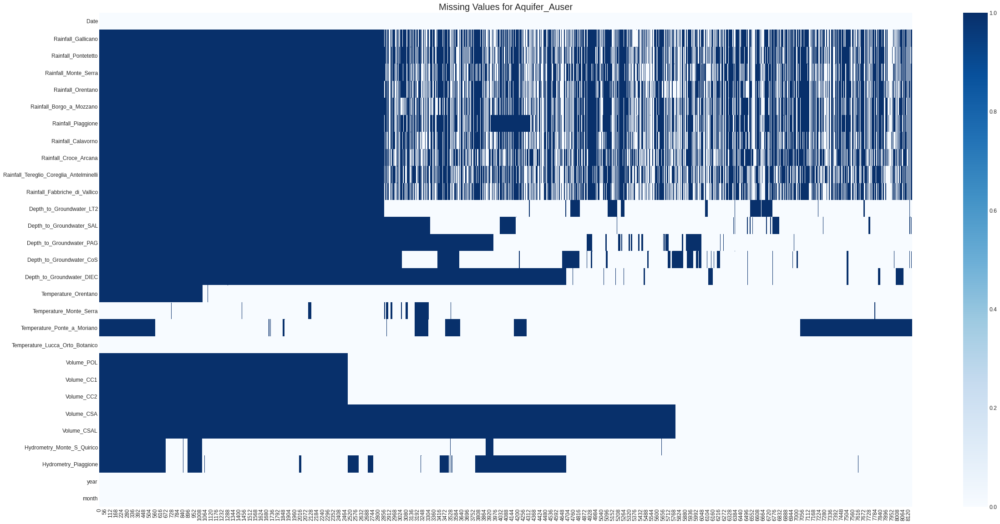

Dataset Name -  Aquifer_Doganella
Target Attributes -  ['Depth_to_Groundwater_Pozzo_1', 'Depth_to_Groundwater_Pozzo_2', 'Depth_to_Groundwater_Pozzo_3', 'Depth_to_Groundwater_Pozzo_4', 'Depth_to_Groundwater_Pozzo_5', 'Depth_to_Groundwater_Pozzo_6', 'Depth_to_Groundwater_Pozzo_7', 'Depth_to_Groundwater_Pozzo_8', 'Depth_to_Groundwater_Pozzo_9']
       Rainfall_Monteporzio  ...         year
count           2215.000000  ...  6026.000000
mean               7.053454  ...  2011.755725
std               12.328705  ...     4.767532
min                0.200000  ...  2004.000000
25%                0.200000  ...  2008.000000
50%                1.600000  ...  2012.000000
75%                8.800000  ...  2016.000000
max              112.600000  ...  2020.000000

[8 rows x 22 columns]
<class 'pandas.core.frame.DataFrame'>
Int64Index: 6026 entries, 0 to 6025
Data columns (total 24 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        -----------

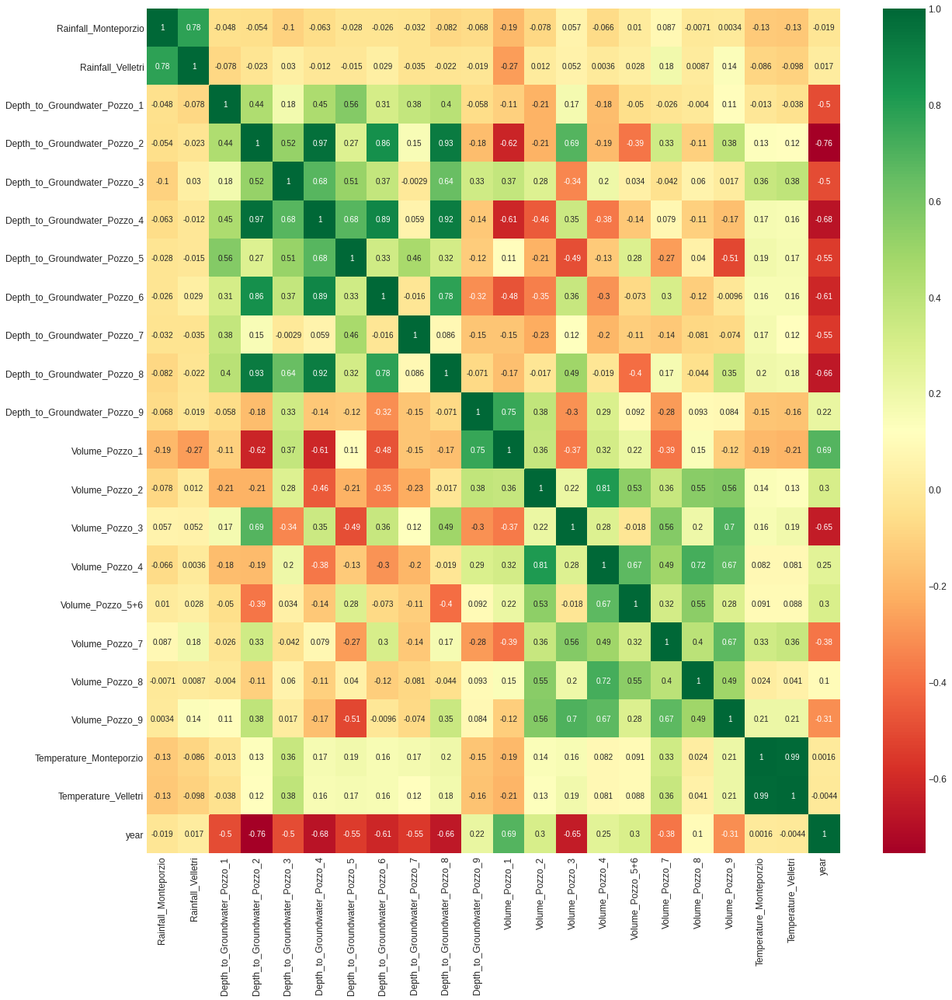

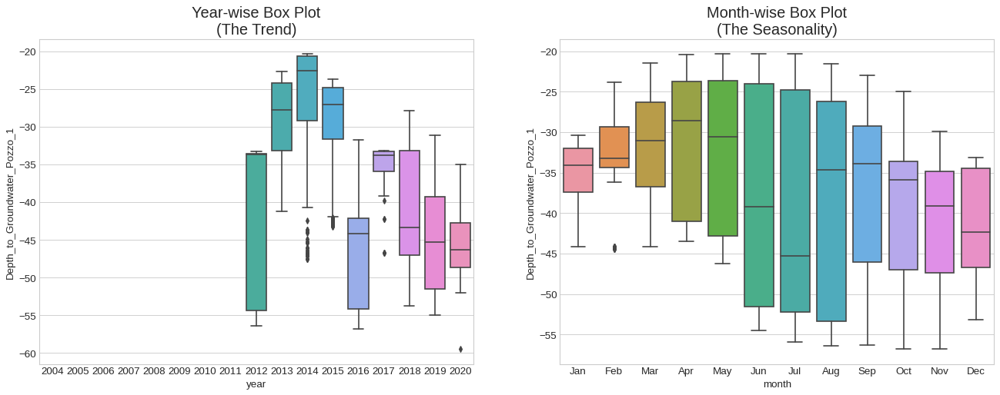

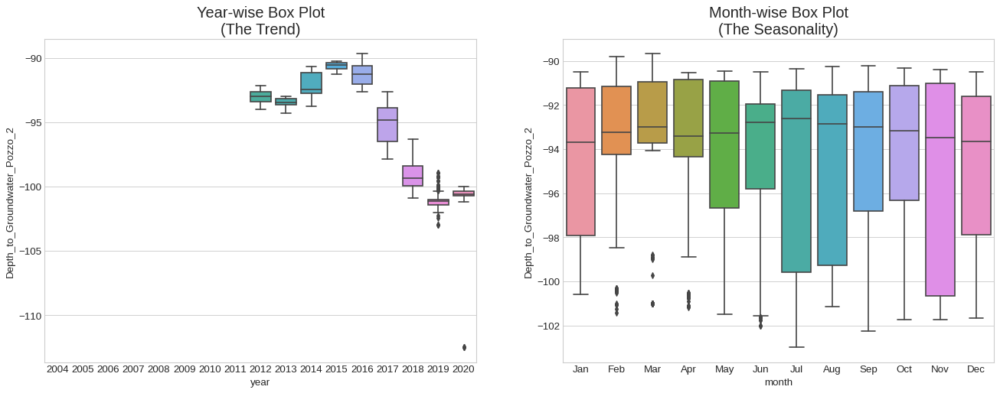

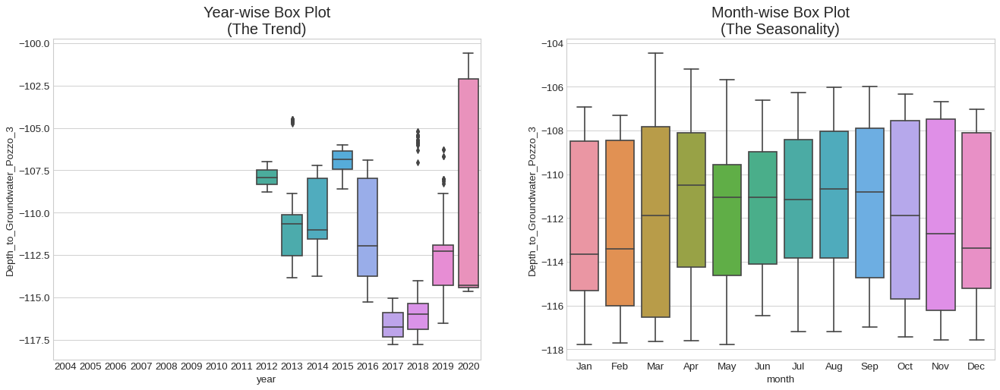

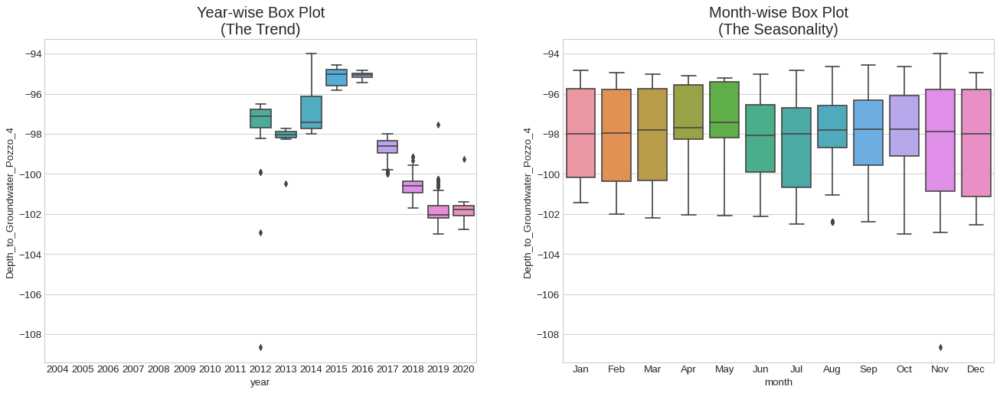

...

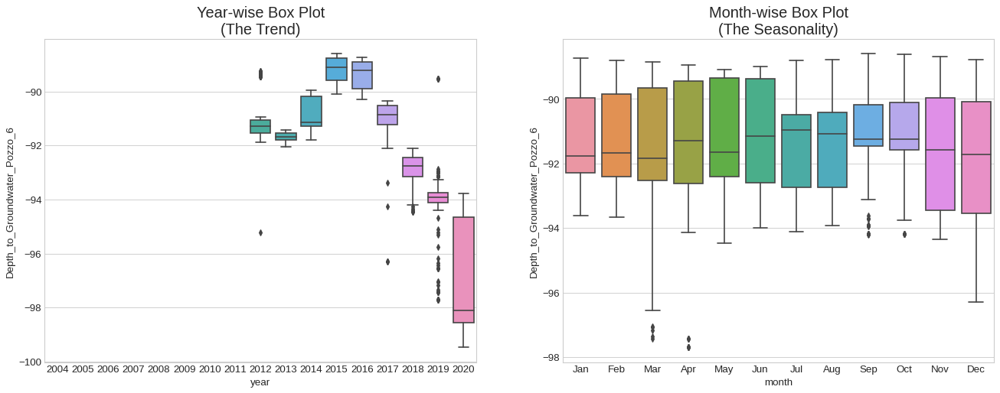

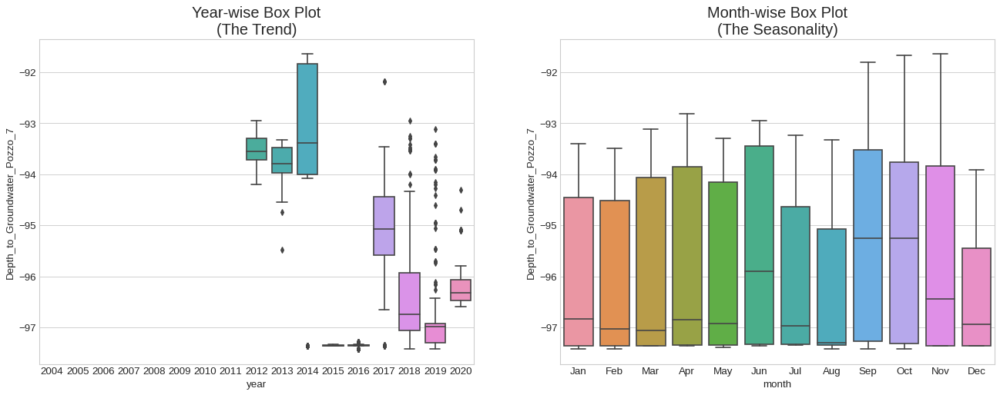

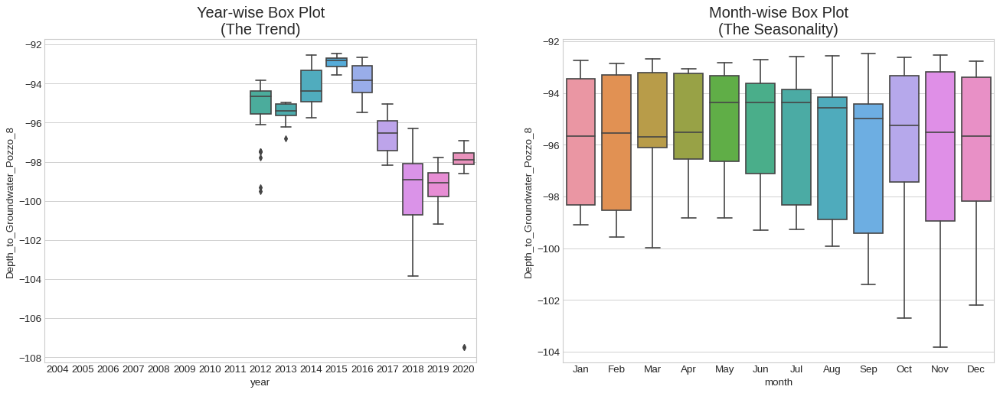

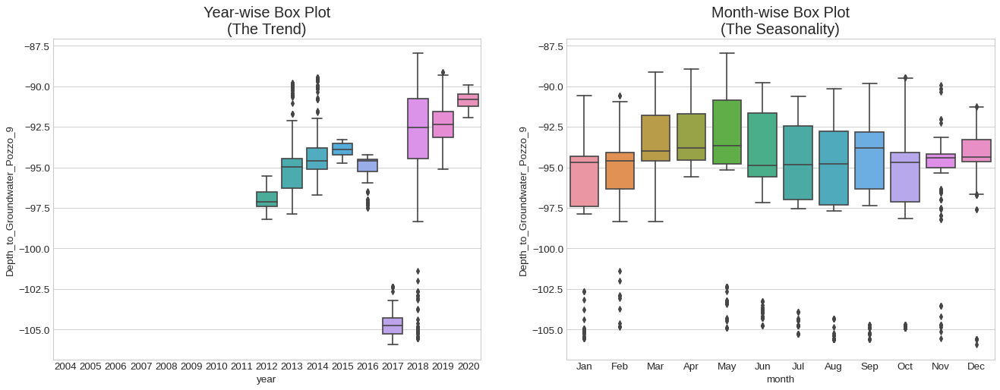

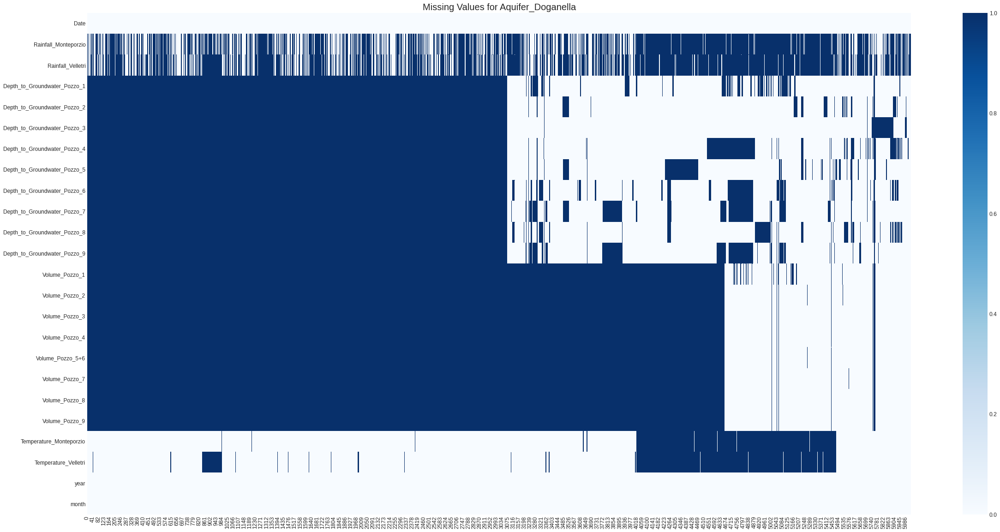

Dataset Name -  Aquifer_Luco
Target Attributes -  ['Depth_to_Groundwater_Podere_Casetta']
       Rainfall_Simignano  ...         year
count         2658.000000  ...  7487.000000
mean             6.471558  ...  2009.754241
std             10.172488  ...     5.921359
min              0.200000  ...  2000.000000
25%              0.200000  ...  2005.000000
50%              2.200000  ...  2010.000000
75%              8.400000  ...  2015.000000
max             87.800000  ...  2020.000000

[8 rows x 22 columns]
<class 'pandas.core.frame.DataFrame'>
Int64Index: 7487 entries, 0 to 7486
Data columns (total 24 columns):
 #   Column                               Non-Null Count  Dtype         
---  ------                               --------------  -----         
 0   Date                                 7487 non-null   datetime64[ns]
 1   Rainfall_Simignano                   2658 non-null   float64       
 2   Rainfall_Siena_Poggio_al_Vento       339 non-null    float64       
 3   Rainfall_Mensa

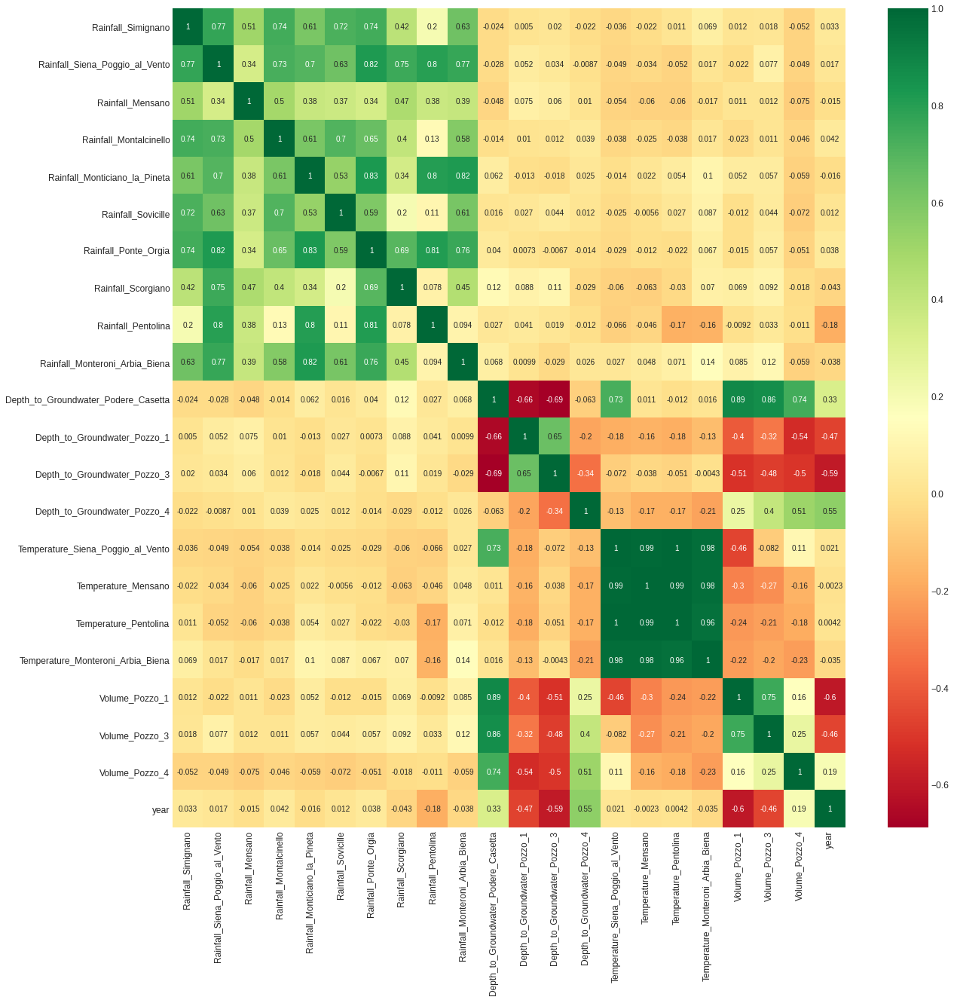

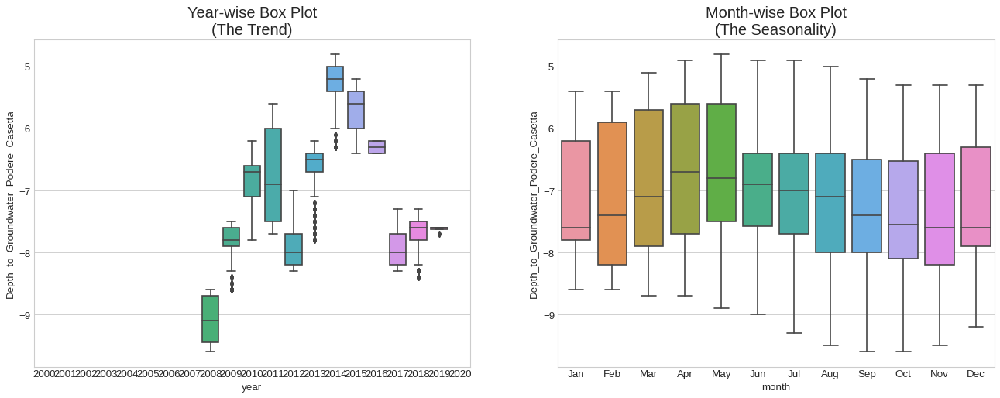

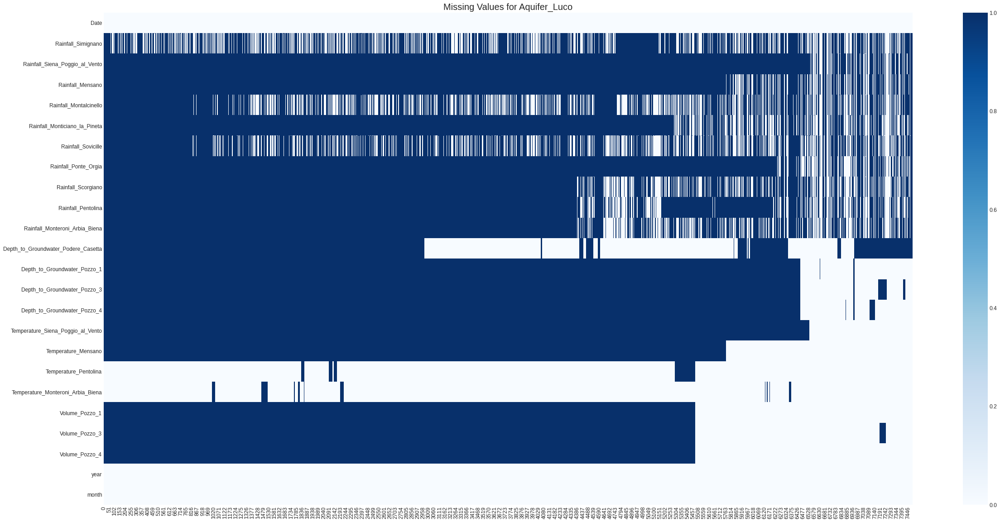

Dataset Name -  Aquifer_Petrignano
Target Attributes -  ['Depth_to_Groundwater_P24', 'Depth_to_Groundwater_P25']
       Rainfall_Bastia_Umbra  ...         year
count            1052.000000  ...  5223.000000
mean                6.213213  ...  2012.850661
std                 8.932613  ...     4.142787
min                 0.100000  ...  2006.000000
25%                 0.500000  ...  2009.000000
50%                 2.500000  ...  2013.000000
75%                 8.600000  ...  2016.000000
max                67.300000  ...  2020.000000

[8 rows x 8 columns]
<class 'pandas.core.frame.DataFrame'>
Int64Index: 5223 entries, 0 to 5222
Data columns (total 10 columns):
 #   Column                                Non-Null Count  Dtype         
---  ------                                --------------  -----         
 0   Date                                  5223 non-null   datetime64[ns]
 1   Rainfall_Bastia_Umbra                 1052 non-null   float64       
 2   Depth_to_Groundwater_P24          

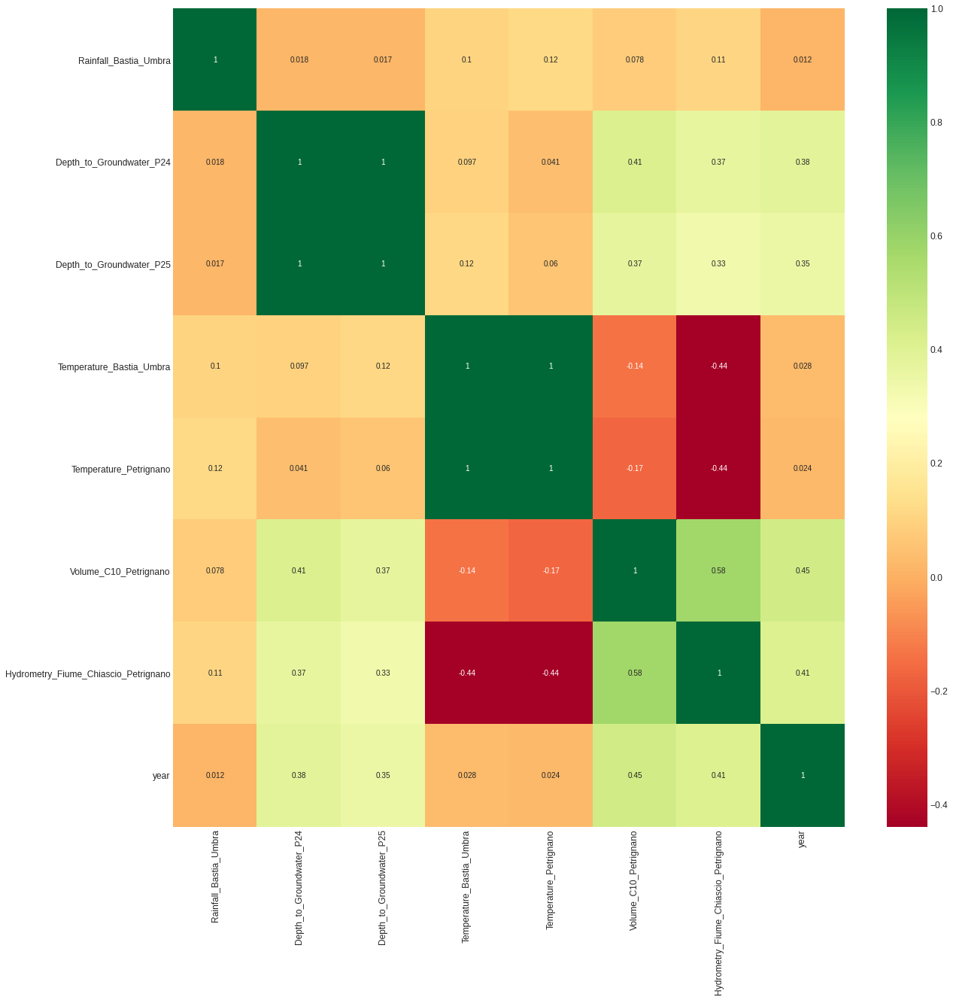

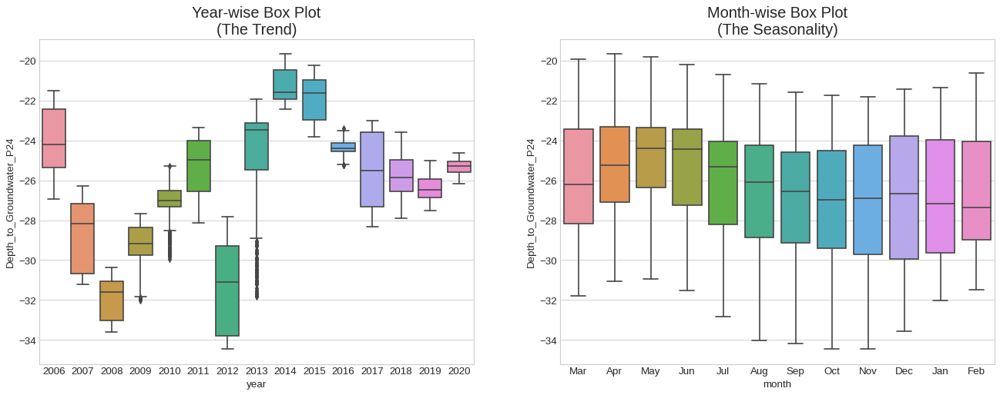

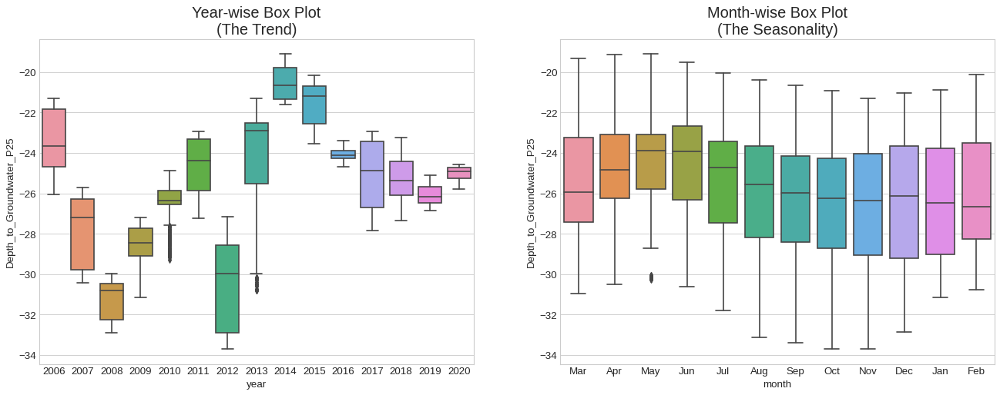

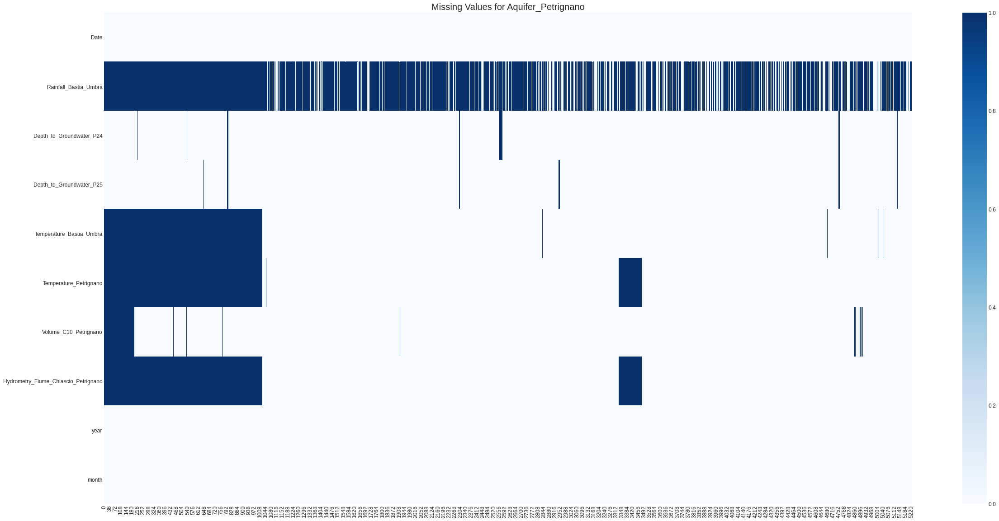

In [16]:
for i in range(0,4):
  print("Dataset Name - ",dataset[i])
  print("Target Attributes - ",all_data_target[i])
  print(all_data[i].describe())
  print(all_data[i].info())
  
  #Correlation Matrix
  corrmat = all_data[i].corr()
  top_corr_features = corrmat.index
  plt.figure(figsize=(20,20))

  #plot heat map
  g=sns.heatmap(all_data[i][top_corr_features].corr(),annot=True,cmap="RdYlGn")
  plt.plot()

  #Box plot for Dependent Attributes
  all_data[i] = box_plot(all_data[i],all_data_target[i])
  plt.show()

  ## Null Values
  nagraph(dataset[i],all_data[i])

# River Waterbody

Independent Attributes


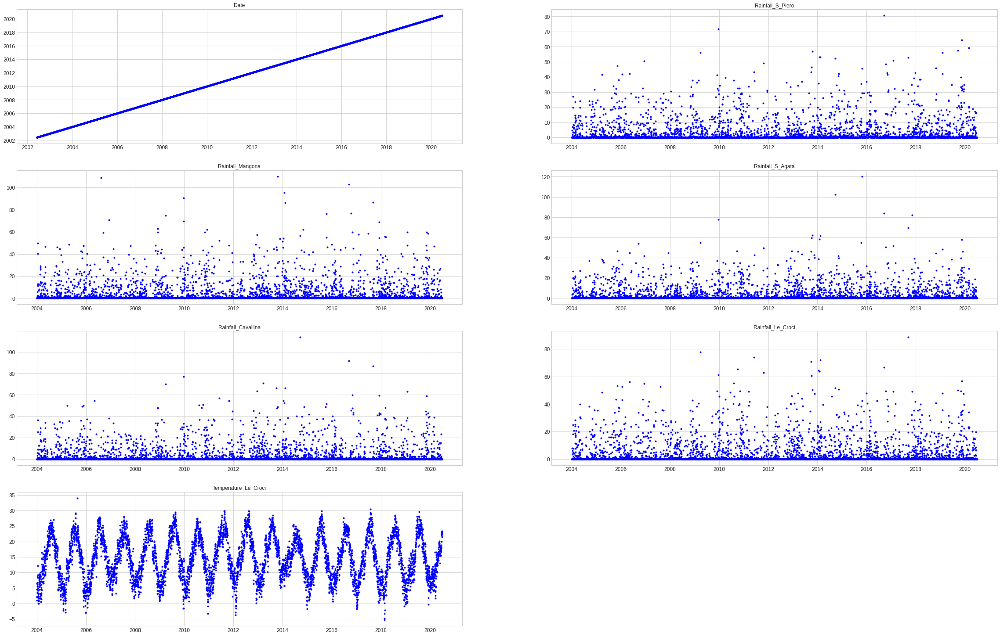

In [17]:
plt.figure(figsize=(40,100))
i=0
for col in all_data[4].columns:
  if col not in all_data_target[4]:
      plt.subplot(15,2, i+1)
      plt.plot(all_data[4].Date,all_data[4][col],'b.')
      plt.title(col)
      i=i+1
plt.show()

Target Attributes

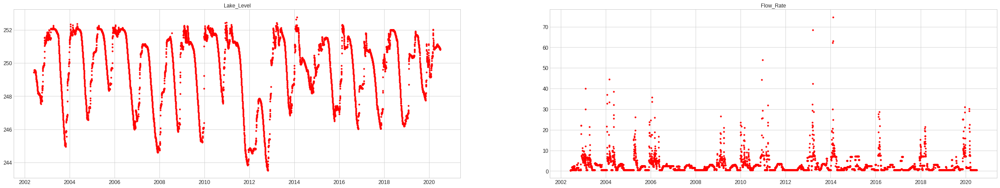

In [18]:
plt.figure(figsize=(40,100))
for i,col in enumerate(all_data_target[4]):
  plt.subplot(12,2, i+1)
  plt.plot(all_data[4].Date,all_data[4][col],'r.')
  plt.title(col)
plt.show()


Dataset Name -  Lake_Bilancino
Target Attributes -  ['Lake_Level', 'Flow_Rate']
       Rainfall_Gallicano  ...         year
count         2085.000000  ...  8154.000000
mean            12.567770  ...  2008.837503
std             20.700458  ...     6.453598
min              0.200000  ...  1998.000000
25%              0.800000  ...  2003.000000
50%              4.400000  ...  2009.000000
75%             16.000000  ...  2014.000000
max            318.800000  ...  2020.000000

[8 rows x 27 columns]
<class 'pandas.core.frame.DataFrame'>
Int64Index: 8154 entries, 0 to 8153
Data columns (total 29 columns):
 #   Column                                   Non-Null Count  Dtype         
---  ------                                   --------------  -----         
 0   Date                                     8154 non-null   datetime64[ns]
 1   Rainfall_Gallicano                       2085 non-null   float64       
 2   Rainfall_Pontetetto                      1945 non-null   float64       
 3   Rain

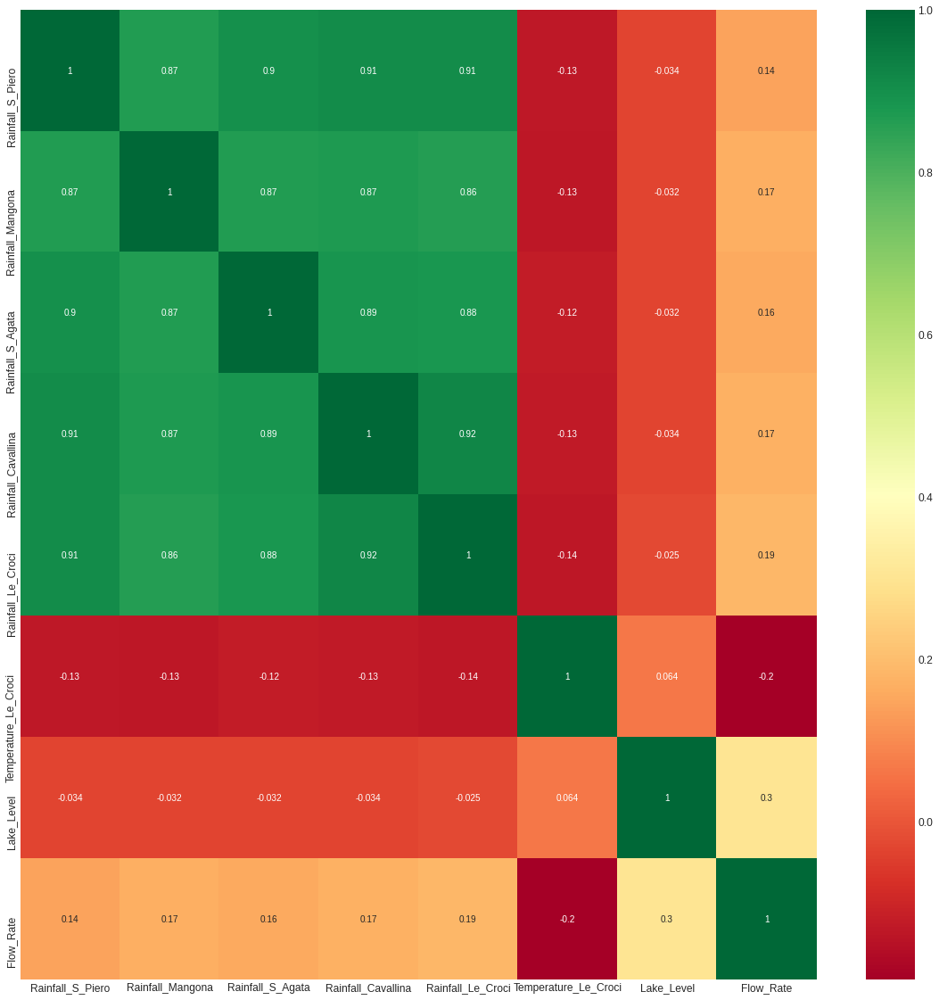

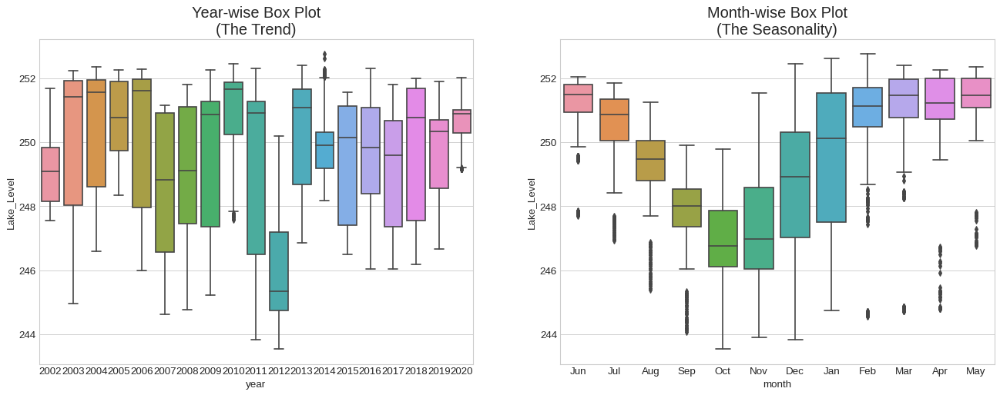

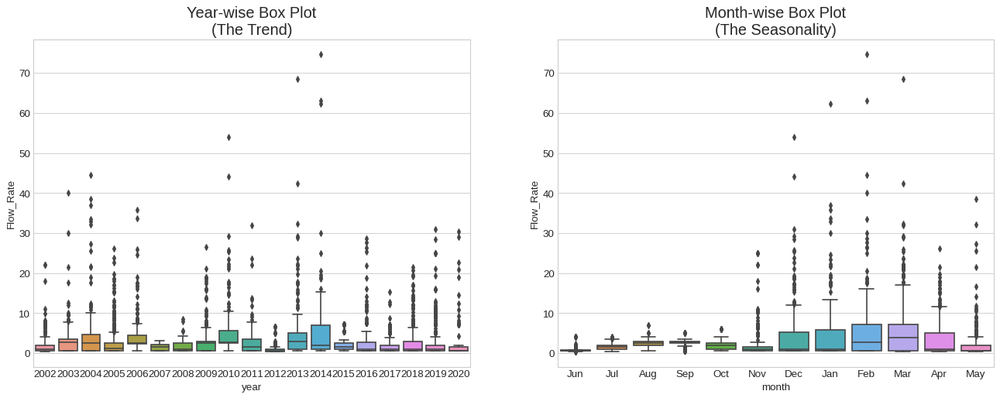

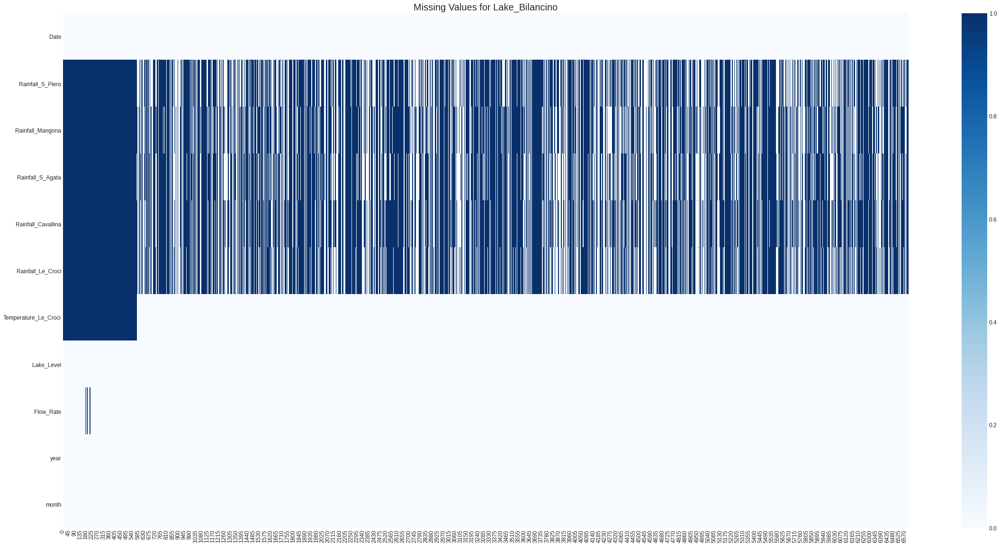

In [19]:
for i in range(4,5):
  print("Dataset Name - ",dataset[i])
  print("Target Attributes - ",all_data_target[i])
  print(all_data[0].describe())
  print(all_data[0].info())
  
  corrmat = all_data[i].corr()
  top_corr_features = corrmat.index
  plt.figure(figsize=(20,20))
  #plot heat map
  g=sns.heatmap(all_data[i][top_corr_features].corr(),annot=True,cmap="RdYlGn")
  plt.plot()
  all_data[i] = box_plot(all_data[i],all_data_target[i])
  plt.show()
  nagraph(dataset[i],all_data[i])

# **RIVER**

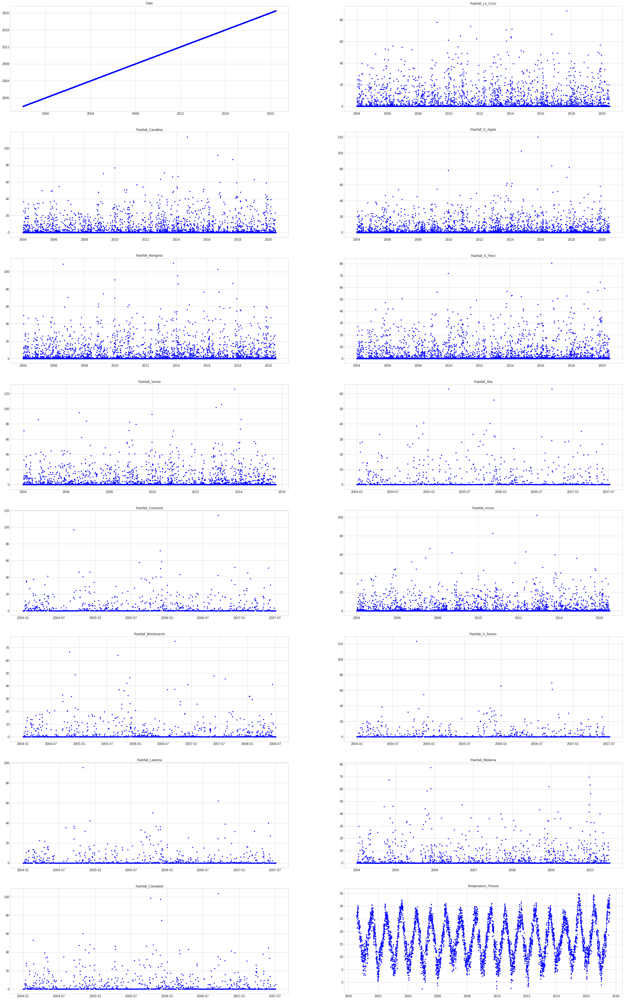

In [20]:
plt.figure(figsize=(40,100))
i=0
for col in all_data[5].columns:
  if col not in all_data_target[5]:
      plt.subplot(12,2, i+1)
      plt.plot(all_data[5].Date,all_data[5][col],'b.')
      plt.title(col)
      i=i+1
plt.show()

Dataset Name -  River_Arno
Target Attributes -  ['Hydrometry_Nave_di_Rosano']
       Rainfall_Le_Croci  ...  Hydrometry_Nave_di_Rosano
count        6026.000000  ...                8169.000000
mean            3.129871  ...                   1.472407
std             8.025121  ...                   0.616259
min             0.000000  ...                   0.000000
25%             0.000000  ...                   1.100000
50%             0.000000  ...                   1.300000
75%             1.200000  ...                   1.690000
max            88.400000  ...                   6.750000

[8 rows x 16 columns]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8217 entries, 0 to 8216
Data columns (total 17 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Date                       8217 non-null   datetime64[ns]
 1   Rainfall_Le_Croci          6026 non-null   float64       
 2   Rainfall_Cavallina    

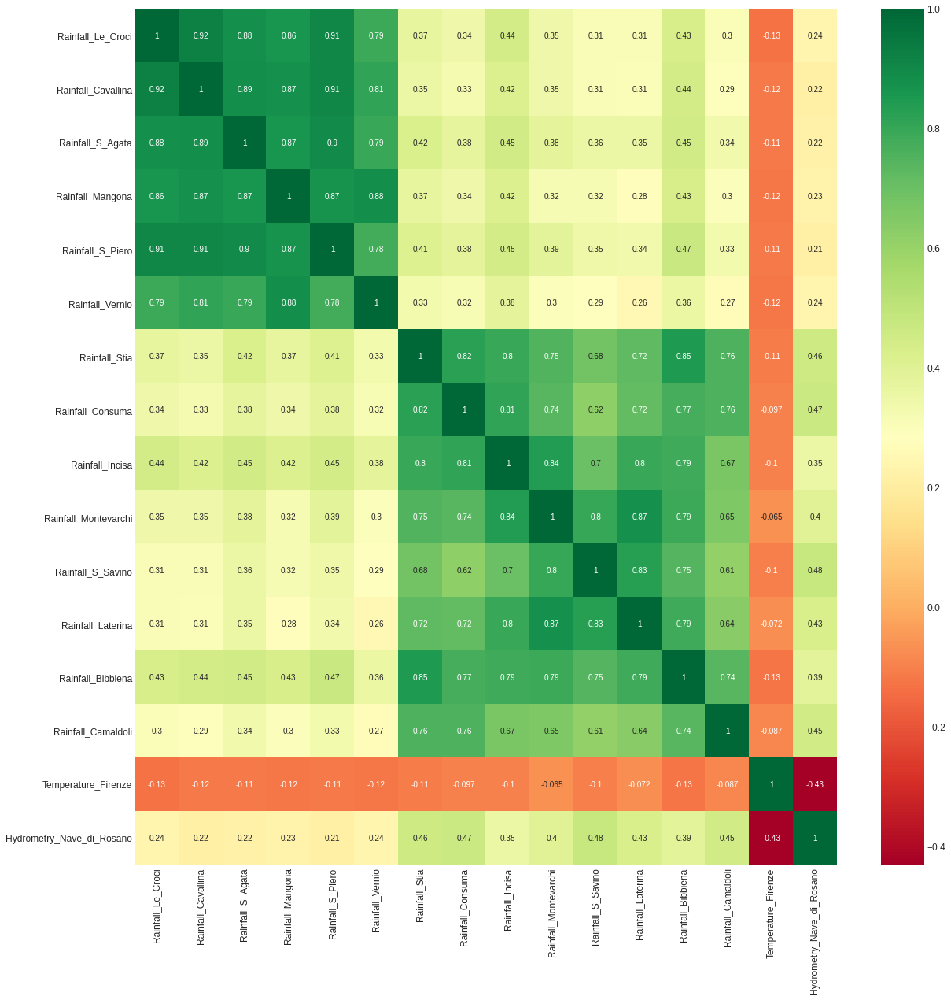

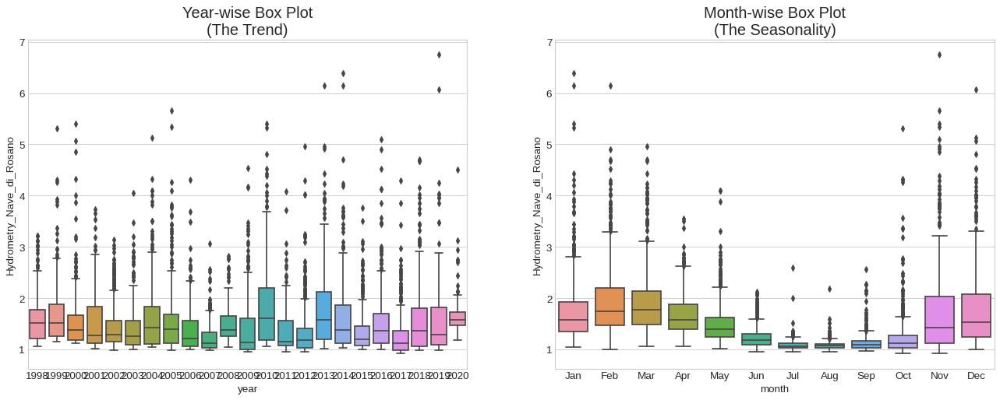

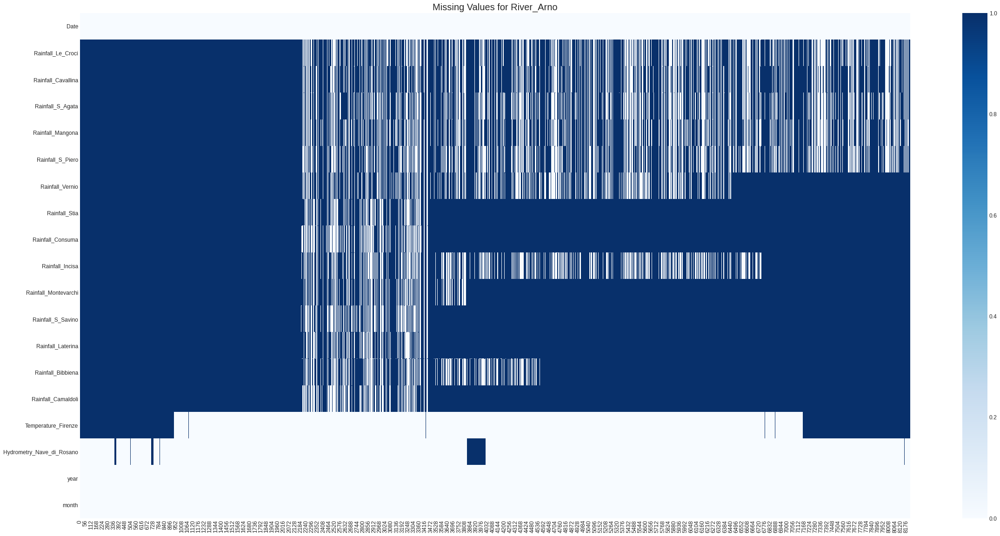

In [21]:
for i in range(5,6):
  print("Dataset Name - ",dataset[i])
  print("Target Attributes - ",all_data_target[i])
  print(all_data[i].describe())
  print(all_data[i].info())
  
  corrmat = all_data[i].corr()
  top_corr_features = corrmat.index
  plt.figure(figsize=(20,20))
  #plot heat map
  g=sns.heatmap(all_data[i][top_corr_features].corr(),annot=True,cmap="RdYlGn")
  plt.plot()
  all_data[i] = box_plot(all_data[i],all_data_target[i])
  plt.show()
  nagraph(dataset[i],all_data[i])

**Observations** -

Volumes of rainfall are quite volatile both across locations and at different times of the year. However, we cannot observe apparent seasonal patterns.

Temperatures seems mostly between 0°C and 30°C. In addition, the temperature shows quite a strong annual cycle.

The hydrometry shows quite a strong annual cycle. In addition, it seems that the river did stop flow between July 3, 2008 and December 31, 2008. Given the starting and ending dates, it seems either missing data or some man-made reasons had halted the river flow.

From correlation matrix it is observed that Hydrometry is highly correlated with Temperature Attribute.

From Boxplots it is observed that Dependent attribute characterizes seasonality.

From missing values graph it is observed that most of the values related to rainfall columns have null values.

# **Water Spring**

Independent Attributes

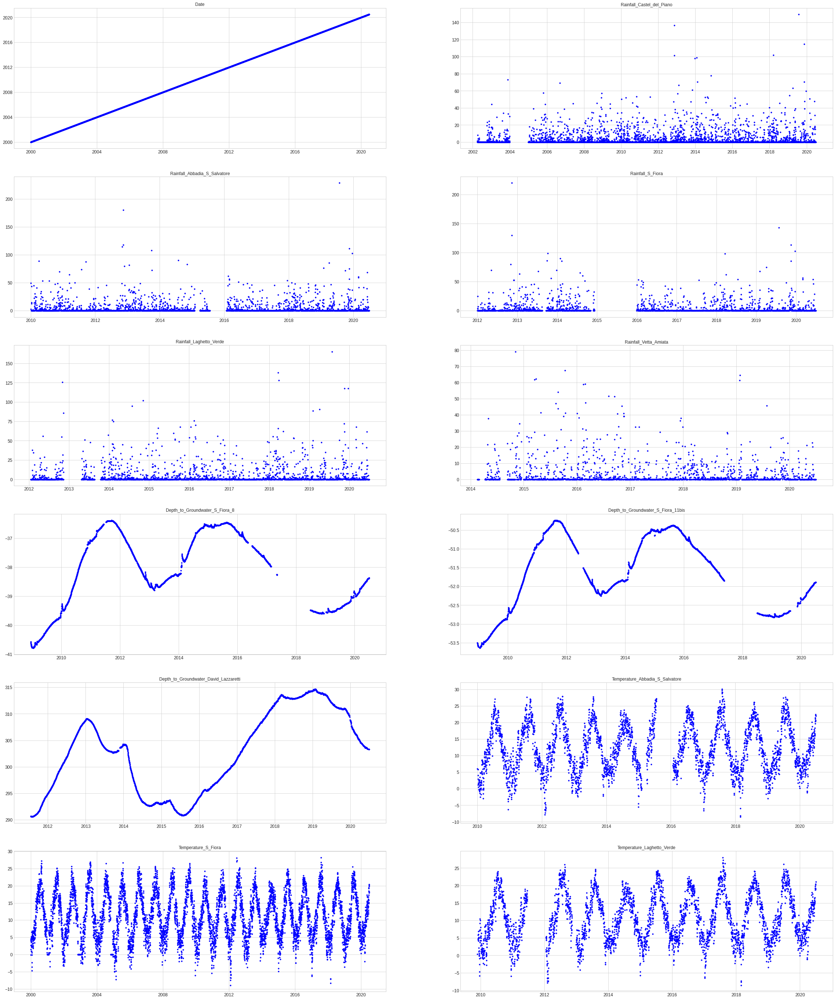

In [22]:
plt.figure(figsize=(40,100))
i=0
for col in all_data[6].columns:
  if col not in all_data_target[6]:
      plt.subplot(12,2, i+1)
      plt.plot(all_data[6].Date,all_data[6][col],'b.')
      plt.title(col)
      i=i+1
plt.show()

Target Attributes

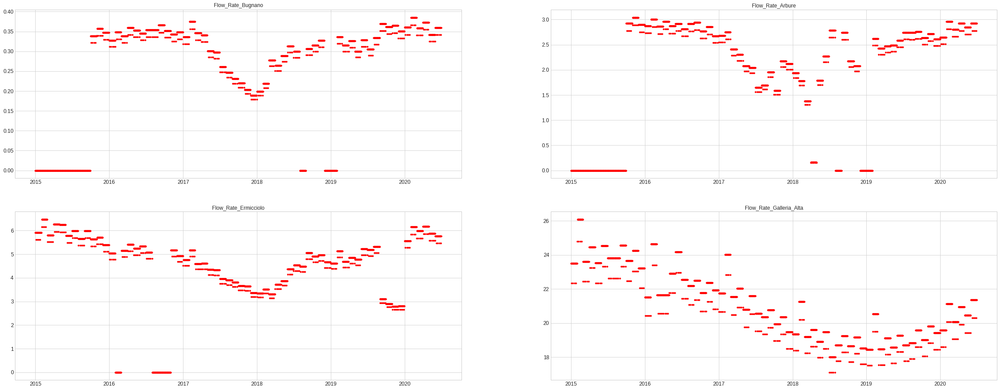

In [23]:
plt.figure(figsize=(40,100))
for i,col in enumerate(all_data_target[6]):
  plt.subplot(12,2, i+1)
  plt.plot(all_data[6].Date,all_data[6][col],'r.')
  plt.title(col)
plt.show()

Dataset Name -  Water_Spring_Amiata
Target Attributes -  ['Flow_Rate_Bugnano', 'Flow_Rate_Arbure', 'Flow_Rate_Ermicciolo', 'Flow_Rate_Galleria_Alta']
       Rainfall_Castel_del_Piano  ...  Flow_Rate_Galleria_Alta
count                6291.000000  ...              2008.000000
mean                    2.624034  ...                20.972385
std                     7.997019  ...                 2.034663
min                     0.000000  ...                17.098023
25%                     0.000000  ...                19.241000
50%                     0.000000  ...                20.718974
75%                     0.600000  ...                22.485956
max                   149.600000  ...                26.089554

[8 rows x 15 columns]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7487 entries, 0 to 7486
Data columns (total 16 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0 

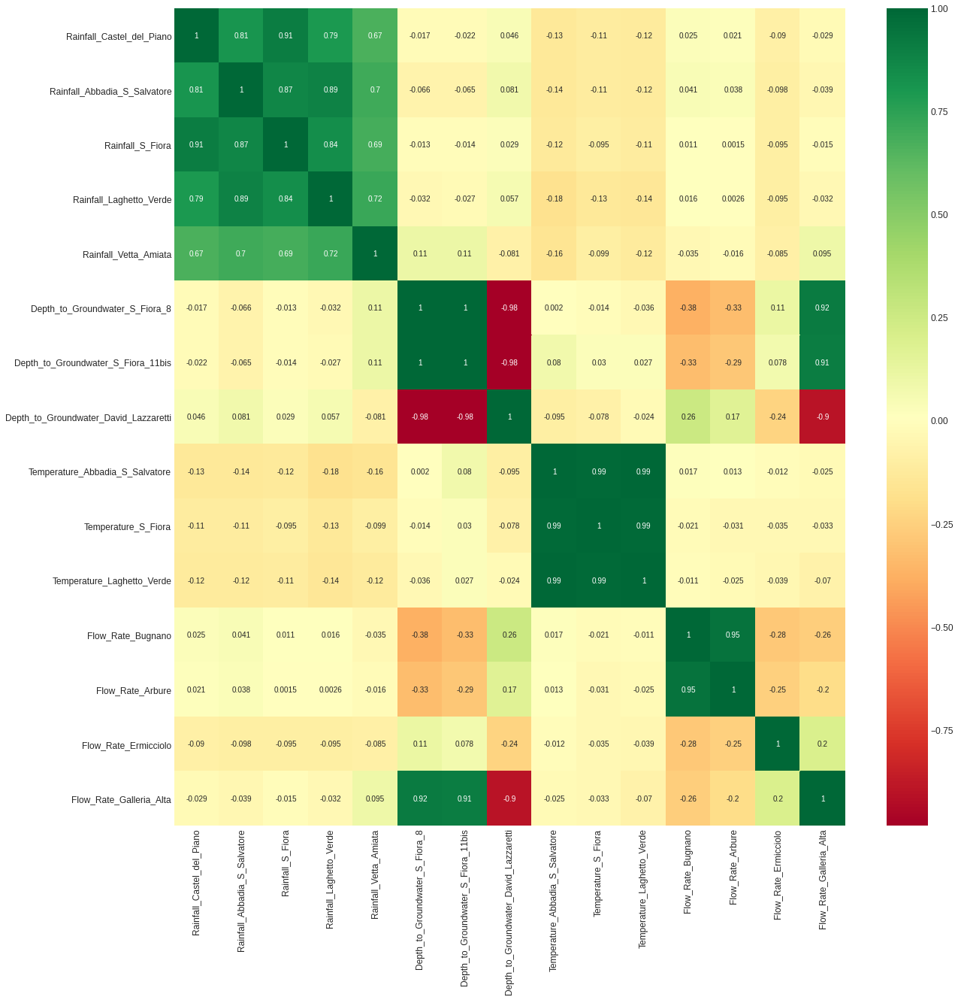

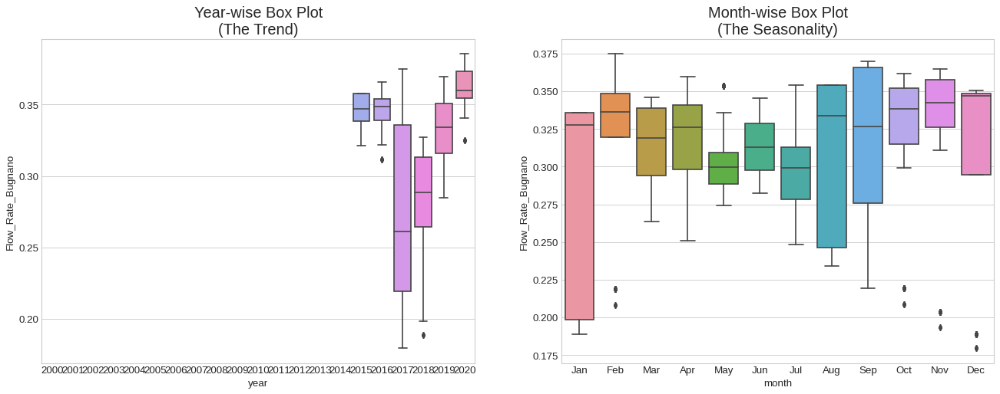

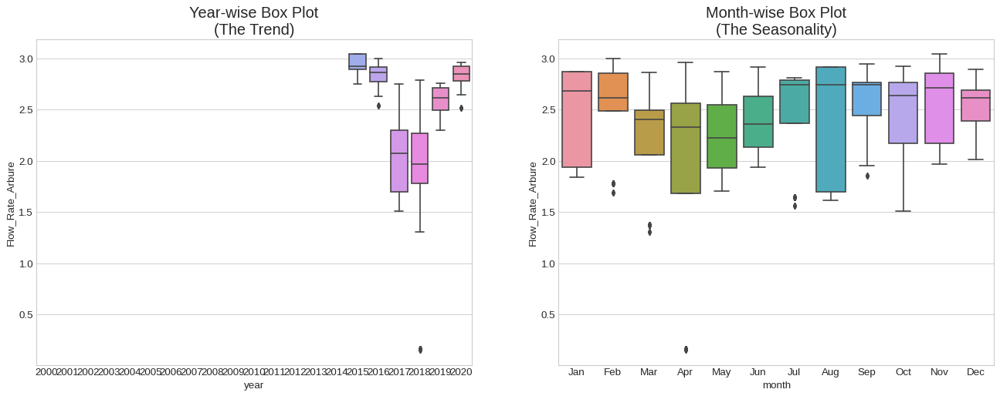

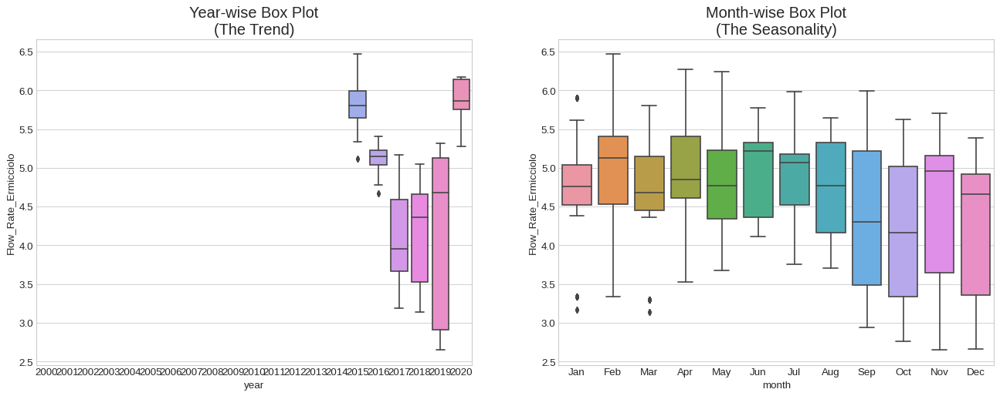

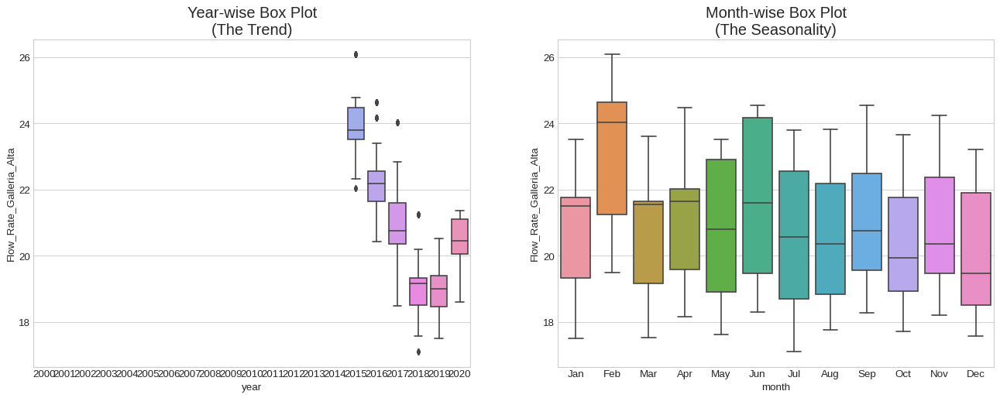

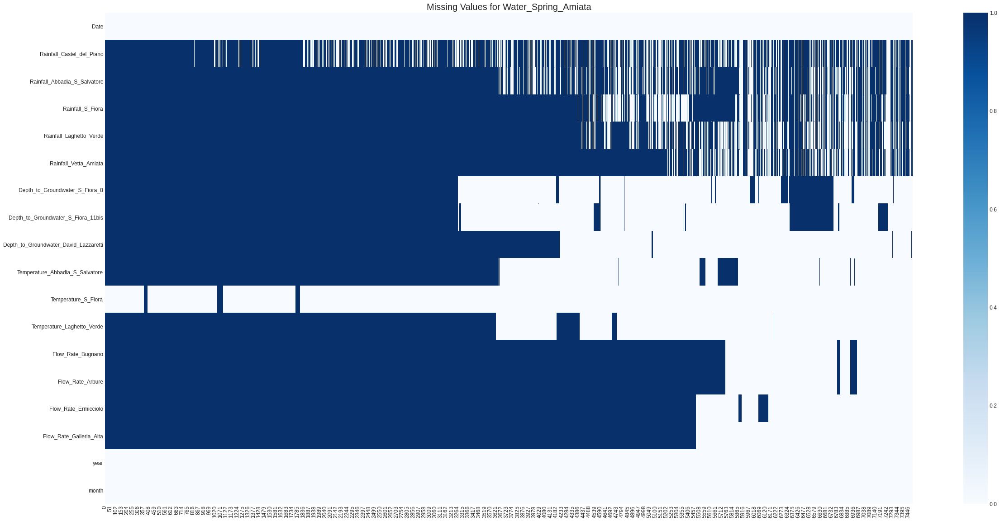

Dataset Name -  Water_Spring_Lupa
Target Attributes -  ['Flow_Rate_Lupa']
       Rainfall_Terni  Flow_Rate_Lupa
count     4199.000000     3817.000000
mean         2.466355       97.712916
std          2.041837       15.026314
min          0.000000        0.000000
25%          1.402000       87.220000
50%          2.142000       96.590000
75%          3.165000      105.760000
max         76.000000      182.310000
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4199 entries, 0 to 4198
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Date            4199 non-null   datetime64[ns]
 1   Rainfall_Terni  4199 non-null   float64       
 2   Flow_Rate_Lupa  3817 non-null   float64       
dtypes: datetime64[ns](1), float64(2)
memory usage: 98.5 KB
None


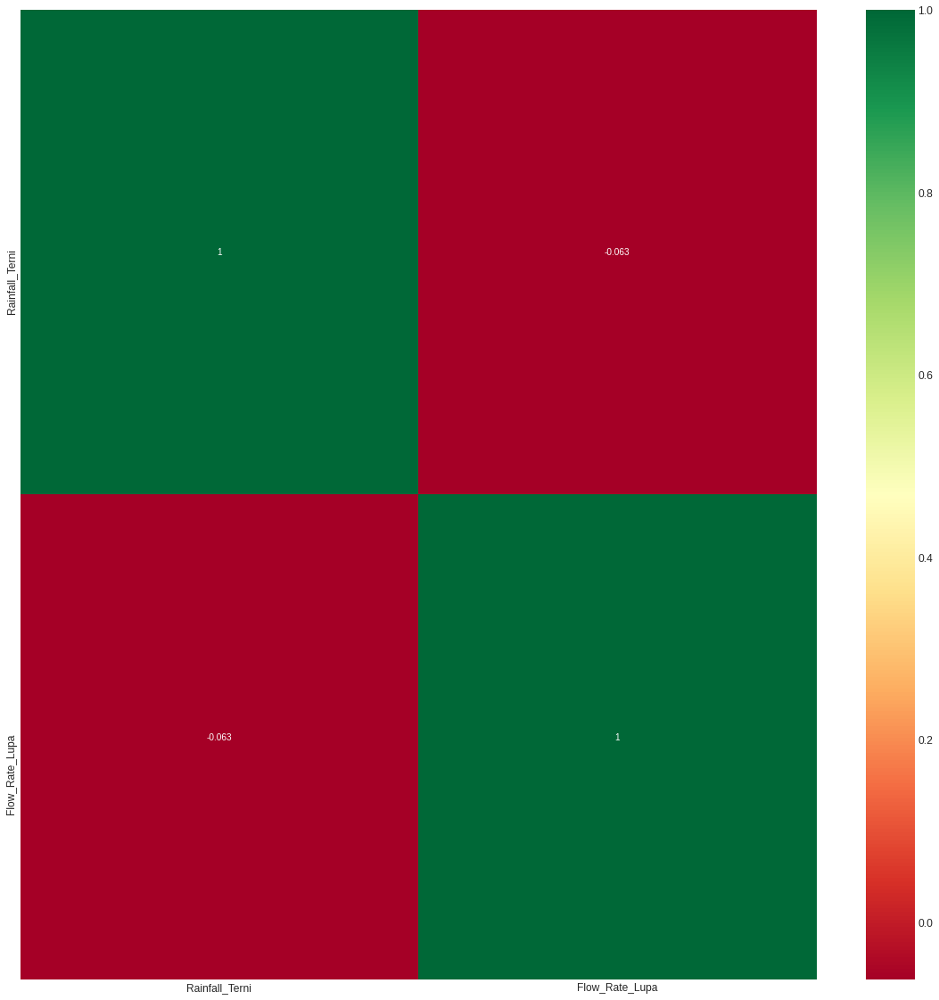

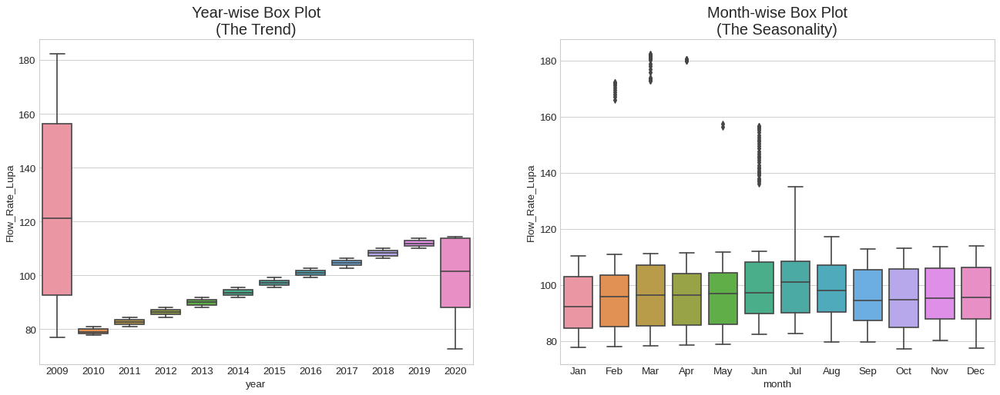

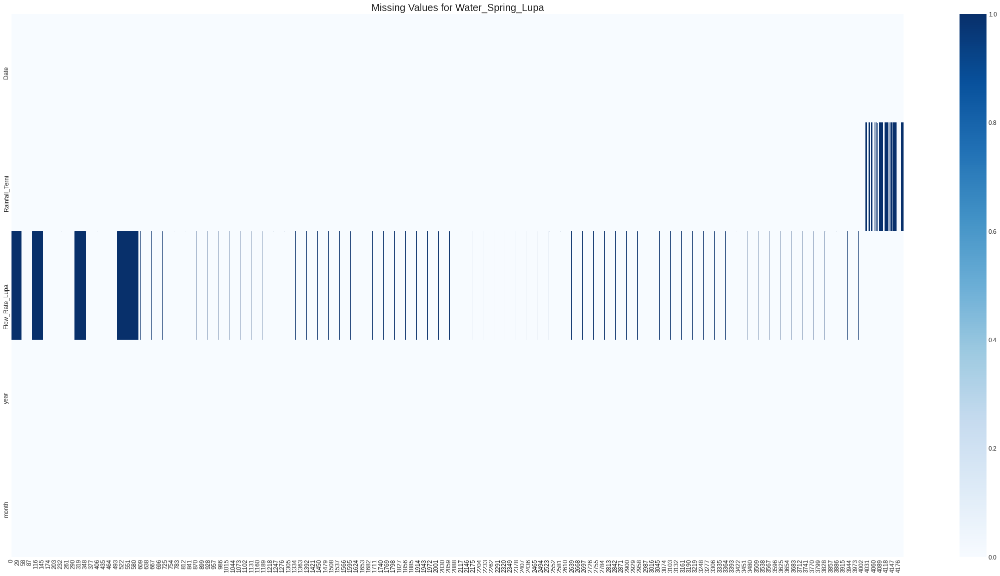

Dataset Name -  Water_Spring_Madonna_di_Canneto
Target Attributes -  ['Flow_Rate_Madonna_di_Canneto']
       Rainfall_Settefrati  ...  Flow_Rate_Madonna_di_Canneto
count          2557.000000  ...                   1387.000000
mean              4.252444  ...                    263.160470
std              10.242426  ...                     32.073660
min               0.000000  ...                    187.753182
25%               0.000000  ...                    224.659081
50%               0.000000  ...                    277.045159
75%               3.600000  ...                    290.165584
max             140.800000  ...                    300.160983

[8 rows x 3 columns]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3113 entries, 0 to 3112
Data columns (total 4 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   Date                          3104 non-null   datetime64[ns]
 1   Rainfall_

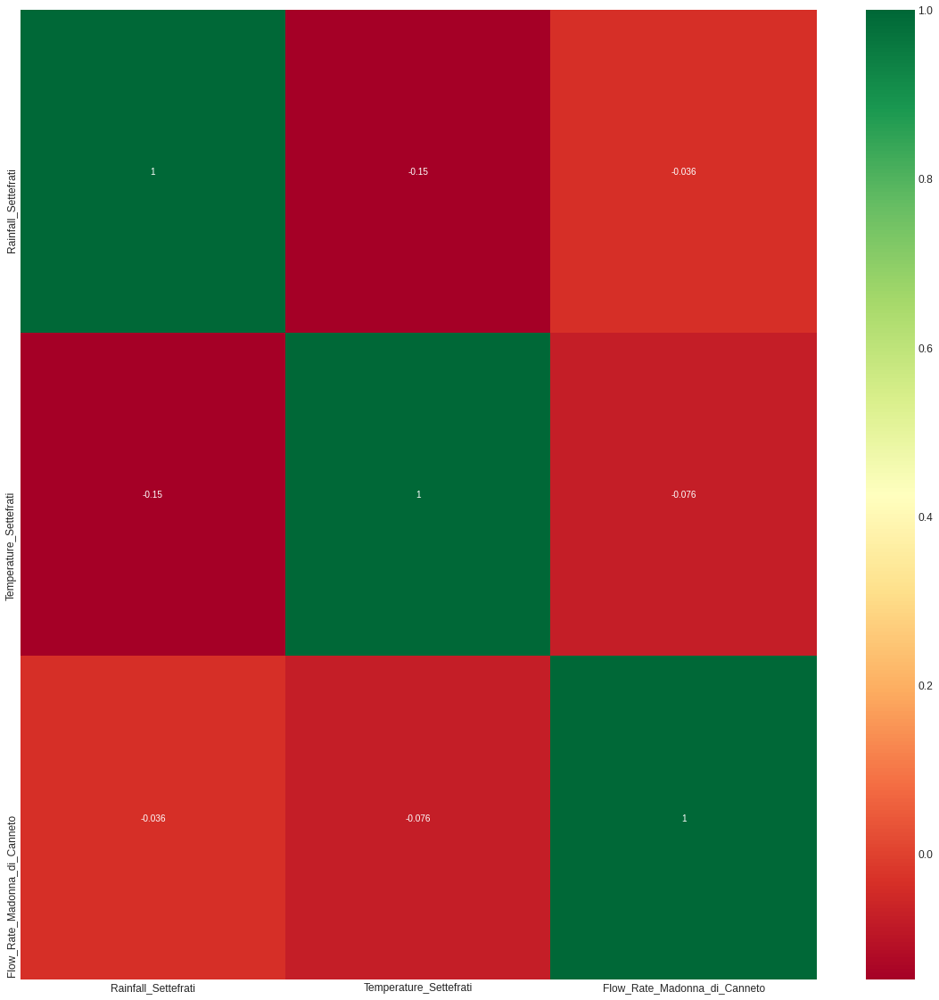

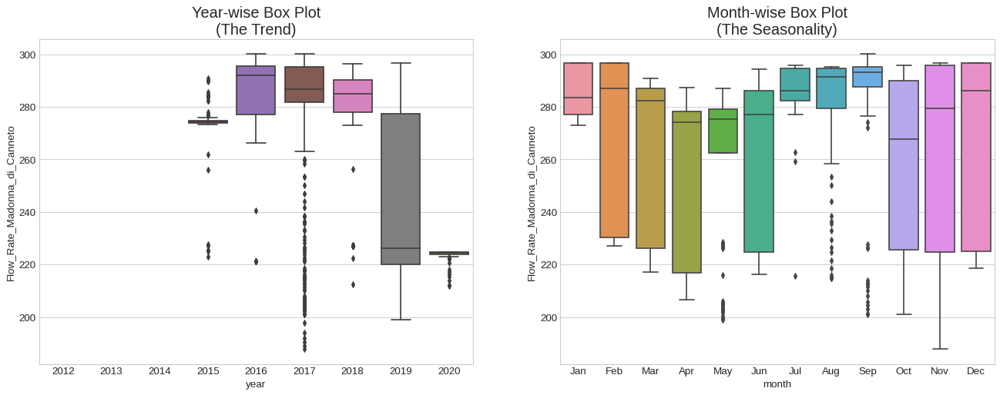

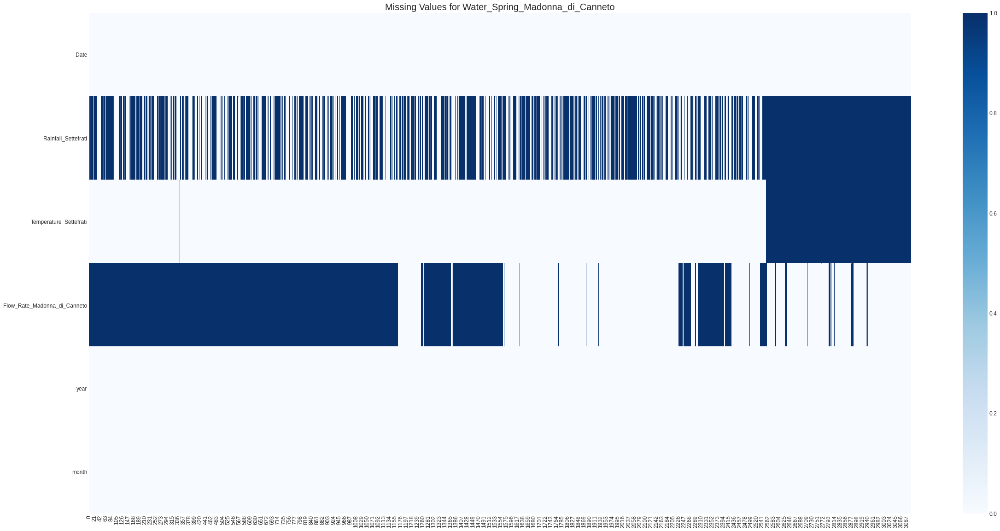

In [24]:
for i in range(6,9):
  print("Dataset Name - ",dataset[i])
  print("Target Attributes - ",all_data_target[i])
  print(all_data[i].describe())
  print(all_data[i].info())
  
  corrmat = all_data[i].corr()
  top_corr_features = corrmat.index
  plt.figure(figsize=(20,20))
  #plot heat map
  g=sns.heatmap(all_data[i][top_corr_features].corr(),annot=True,cmap="RdYlGn")
  plt.plot()
  all_data[i] = box_plot(all_data[i],all_data_target[i])
  plt.show()
  nagraph(dataset[i],all_data[i])

Observations -

Volumes of rainfall are quite volatile both across locations and at different times of the year. However, we cannot observe apparent seasonal patterns.

Temperatures seems mostly between 0°C and 30°C. In addition, the temperature shows quite a strong annual cycle.

The hydrometry shows quite a strong annual cycle. In addition, it seems that the river did stop flow between July 3, 2008 and December 31, 2008. Given the starting and ending dates, it seems either missing data or some man-made reasons had halted the river flow.

From correlation matrix it is observed that Hydrometry is highly correlated with Temperature Attribute.

From Boxplots it is observed that Dependent attribute characterizes seasonality.

From missing values graph it is observed that most of the values related to rainfall columns have null values.

# Feature Selection

In [25]:
year_to_select =  [2011,2017,2017,2009,2004,2004,2016,2011,2017]   #found from the graphs (by observation)
def select_dates(acea_df,year):
    acea_df['year'] = pd.DatetimeIndex(acea_df['Date']).year 
    acea_df = acea_df[acea_df.year>year-1]
    acea_df.replace(0, np.nan,inplace=True) 
    return acea_df

for i,(acea_df,year) in enumerate(zip(all_data,year_to_select)):
  all_data[i] = select_dates(acea_df,year)

# **HANDLING NULL VALUES**

In [26]:
all_data[0].drop(['Volume_POL','Volume_CC1'],axis=1,inplace=True)
all_data[1].drop(['Volume_Pozzo_1'],axis=1,inplace=True)
all_data[6].drop(['Temperature_Abbadia_S_Salvatore','Temperature_S_Fiora','Temperature_Laghetto_Verde'],axis=1,inplace=True)


In [27]:
all_data[6].isnull().mean()

Date                                     0.000000
Rainfall_Castel_del_Piano                0.686549
Rainfall_Abbadia_S_Salvatore             0.649422
Rainfall_S_Fiora                         0.608643
Rainfall_Laghetto_Verde                  0.544735
Rainfall_Vetta_Amiata                    0.566038
Depth_to_Groundwater_S_Fiora_8           0.348752
Depth_to_Groundwater_S_Fiora_11bis       0.311016
Depth_to_Groundwater_David_Lazzaretti    0.007304
Flow_Rate_Bugnano                        0.056604
Flow_Rate_Arbure                         0.056604
Flow_Rate_Ermicciolo                     0.073646
Flow_Rate_Galleria_Alta                  0.000000
year                                     0.000000
month                                    0.000000
dtype: float64

We will also be removing Independent Attributes having Null values more than 20 percent of the remaining datasets even after the datasets were shortened because of the removal of old data which was achieved through year selection.

In [28]:
for i in range(len(all_data)):
  for cols in all_data[i].columns:
    if cols not in all_data_target[i] and all_data[i][cols].isnull().mean() > 0.2:
        all_data[i].drop([cols],axis=1,inplace=True)
        
  print(all_data[i].columns)

Index(['Date', 'Depth_to_Groundwater_LT2', 'Depth_to_Groundwater_SAL',
       'Depth_to_Groundwater_PAG', 'Depth_to_Groundwater_CoS',
       'Depth_to_Groundwater_DIEC', 'Temperature_Orentano',
       'Temperature_Monte_Serra', 'Temperature_Lucca_Orto_Botanico',
       'Volume_CC2', 'Hydrometry_Monte_S_Quirico', 'Hydrometry_Piaggione',
       'year', 'month'],
      dtype='object')
Index(['Date', 'Depth_to_Groundwater_Pozzo_1', 'Depth_to_Groundwater_Pozzo_2',
       'Depth_to_Groundwater_Pozzo_3', 'Depth_to_Groundwater_Pozzo_4',
       'Depth_to_Groundwater_Pozzo_5', 'Depth_to_Groundwater_Pozzo_6',
       'Depth_to_Groundwater_Pozzo_7', 'Depth_to_Groundwater_Pozzo_8',
       'Depth_to_Groundwater_Pozzo_9', 'Volume_Pozzo_2', 'Volume_Pozzo_3',
       'Volume_Pozzo_4', 'Volume_Pozzo_5+6', 'Volume_Pozzo_7',
       'Volume_Pozzo_8', 'Volume_Pozzo_9', 'year', 'month'],
      dtype='object')
Index(['Date', 'Depth_to_Groundwater_Podere_Casetta', 'Temperature_Mensano',
       'Temperature_Pento

# NULL VALUES IMPUTATION USING ***LGBM***

In [29]:
def data_impute(acea_df,acea_df_target):
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import mean_absolute_error
    import lightgbm as lgb

    features_to_fill = acea_df.columns[:-1]
    temp_df = acea_df[features_to_fill].copy()

    # Create time related features
    temp_df['year'] = pd.DatetimeIndex(temp_df['Date']).year 

    temp_df['month'] = pd.DatetimeIndex(temp_df['Date']).month 
    month_in_year = 12
    temp_df['month_sin'] = np.sin(2*np.pi*temp_df.month/month_in_year)
    temp_df['month_cos'] = np.cos(2*np.pi*temp_df.month/month_in_year)

    temp_df['season'] = temp_df.month%12 // 4 + 1

    temp_df['day_of_year'] = pd.DatetimeIndex(temp_df['Date']).dayofyear
    days_in_year = 365.25
    temp_df['day_of_year_sin'] = np.sin(2*np.pi*temp_df.day_of_year/days_in_year)
    temp_df['day_of_year_cos'] = np.cos(2*np.pi*temp_df.day_of_year/days_in_year)

    temp_df['week_of_year'] = pd.DatetimeIndex(temp_df['Date']).weekofyear
    weeks_in_year = 52.1429
    temp_df['week_of_year_sin'] = np.sin(2*np.pi*temp_df.week_of_year/weeks_in_year)
    temp_df['week_of_year_cos'] = np.cos(2*np.pi*temp_df.week_of_year/weeks_in_year)
    
    features = ['month_sin', 'month_cos', 'day_of_year_sin', 'day_of_year_cos', 'week_of_year_sin', 'week_of_year_cos', 'year', 'season']
    temp_df.drop(['month'],axis=1,inplace=True)
    i=1
    plt.figure(figsize=(40,200))
    for attribute in features_to_fill[1:]:
          if attribute in acea_df_target:
            clr = 'black'
          else:
            clr = 'blue'
          target = attribute
          X = temp_df[temp_df[attribute].notna()][features]#.reset_index(drop=True)
          y = temp_df[temp_df[attribute].notna()][target]#.reset_index(drop=True)
          X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.3)

          X_test = temp_df[features]#.reset_index(drop=True)
          # Model
          params = {'num_leaves': 32,
                    'objective': 'regression_l1',
                    'max_depth': 8,
                    'learning_rate': 0.05,
                    "metric": 'mae',
                    'seed' : 42
                  }

          dtrain = lgb.Dataset(X_train, y_train)
          dvalid = lgb.Dataset(X_valid, y_valid)

          clf = lgb.train(params, dtrain, 5000, valid_sets = [dtrain, dvalid], verbose_eval=False,  early_stopping_rounds=100)

          y_pred_valid = clf.predict(X_valid)
          
          old = temp_df[attribute].copy()
          y_pred = clf.predict(X_test)
          #replacing of actual null values here
          acea_df[attribute] = np.where(acea_df[attribute].isna(), y_pred, acea_df[attribute])
          
          plt.subplot(20,2,i)
          sns.scatterplot(x=acea_df.index, y=acea_df[attribute], color='red',label='predicted')
          sns.scatterplot(x=acea_df.index, y=old.fillna(np.inf), color=clr, label = 'original')
          i=i+1
    plt.show()
    return acea_df



Dataset for imputation - Aquifer_Auser


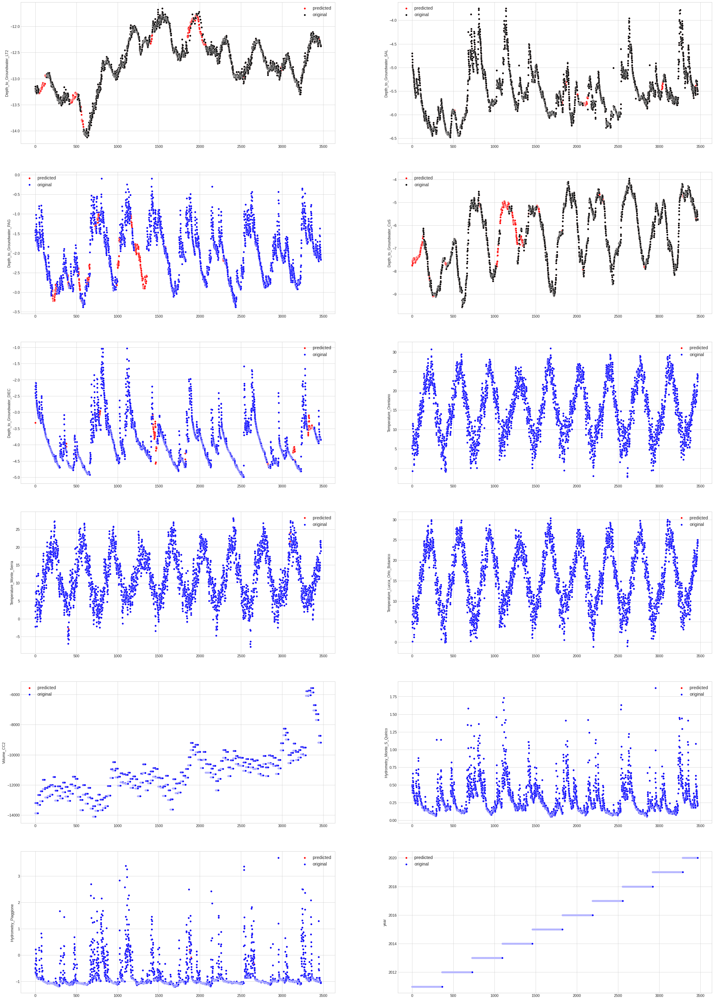

Dataset for imputation - Aquifer_Doganella


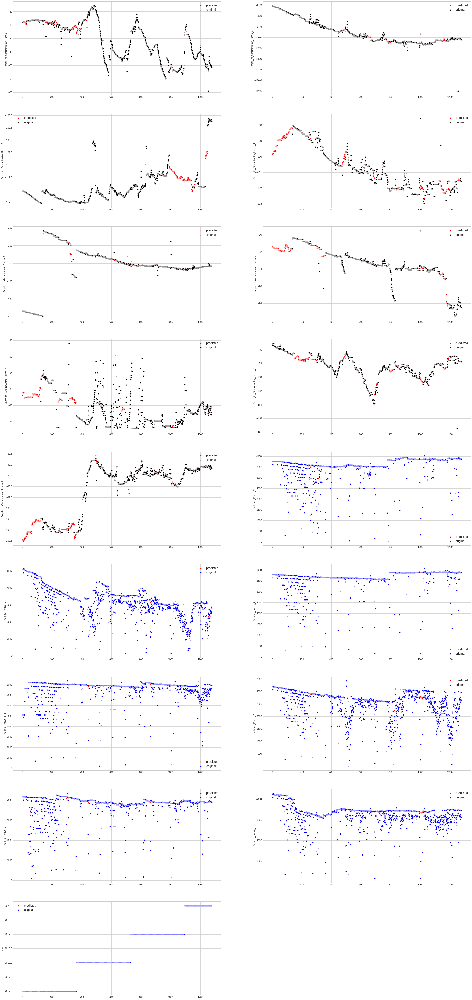

Dataset for imputation - Aquifer_Luco


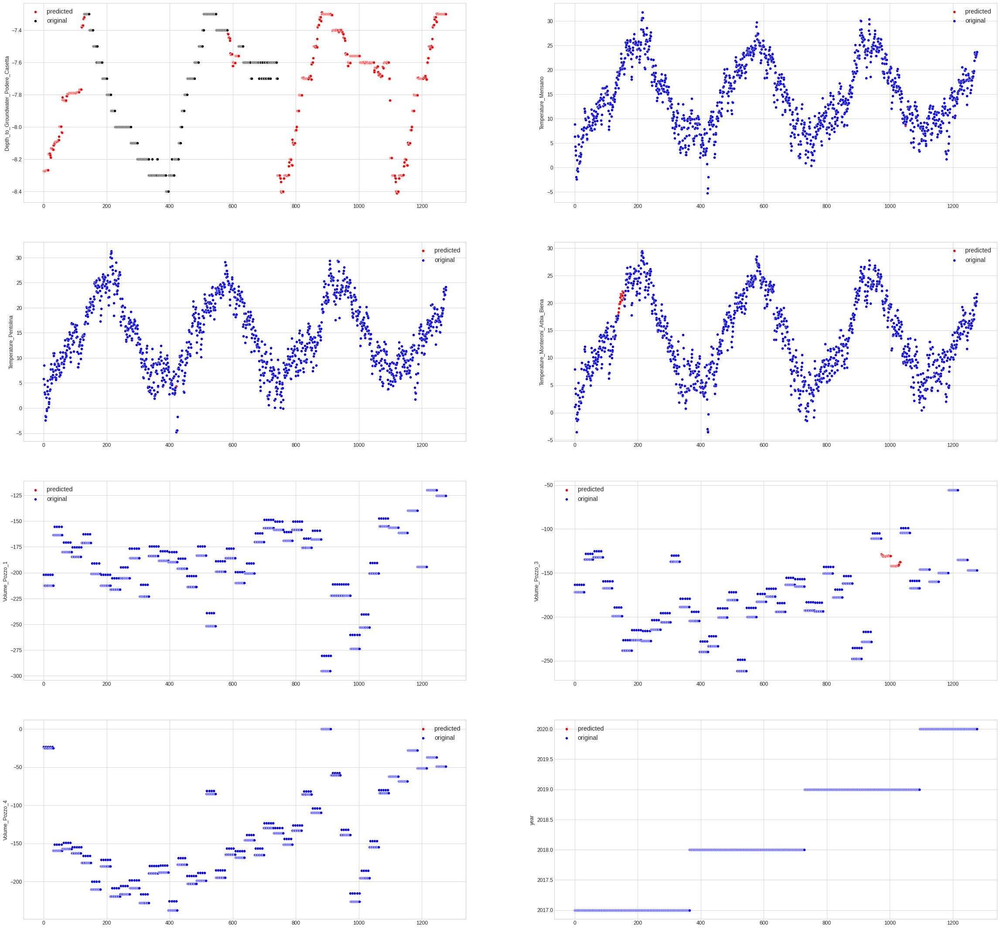

Dataset for imputation - Aquifer_Petrignano


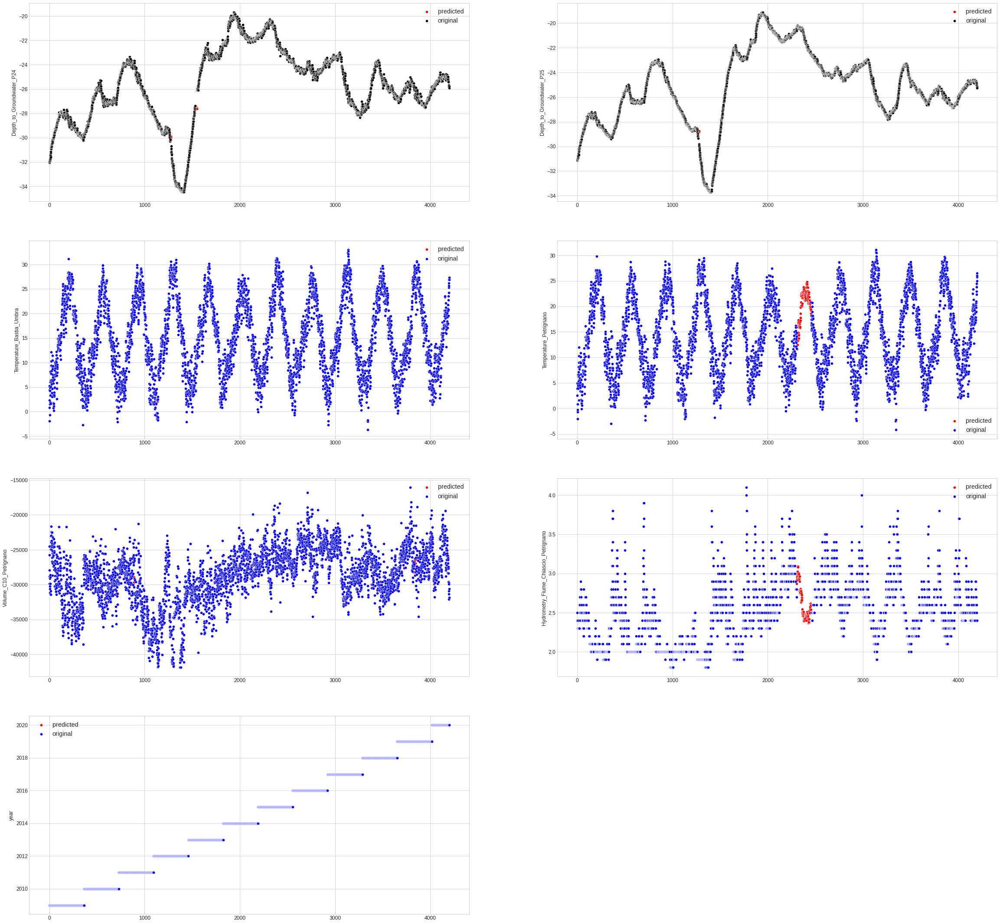

Dataset for imputation - Lake_Bilancino


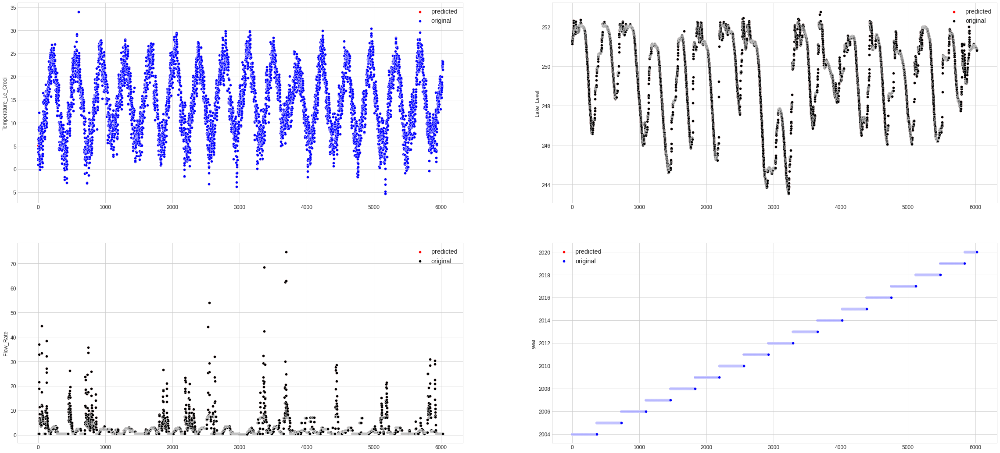

Dataset for imputation - River_Arno


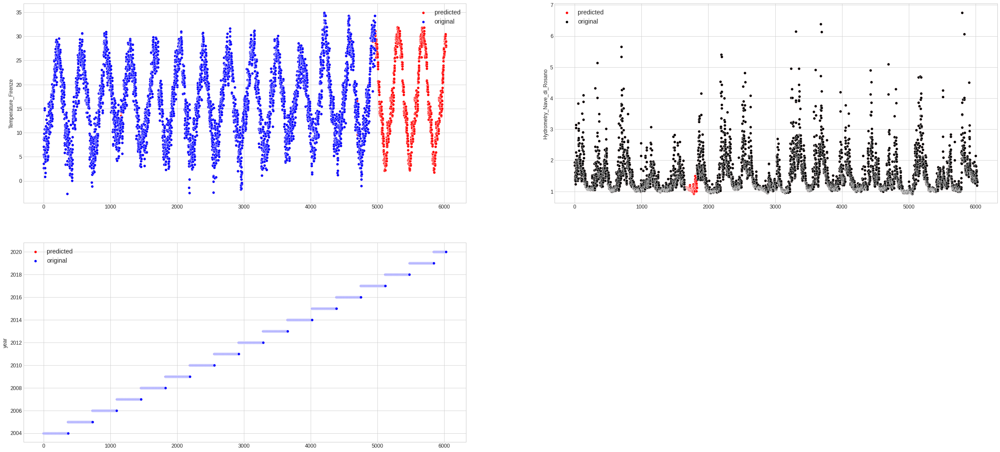

Dataset for imputation - Water_Spring_Amiata


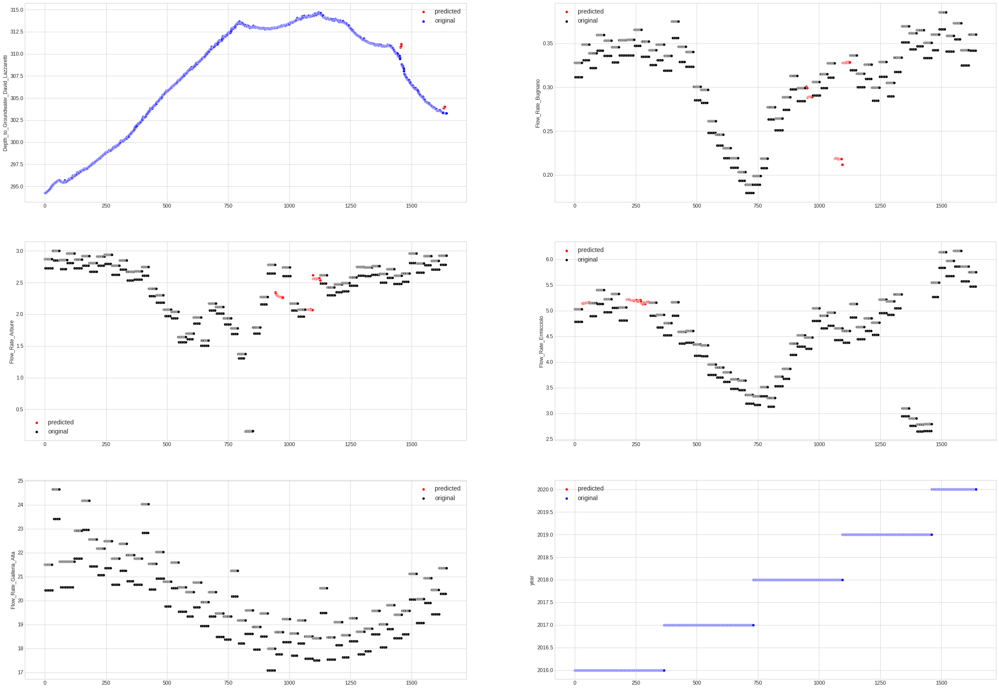

Dataset for imputation - Water_Spring_Lupa


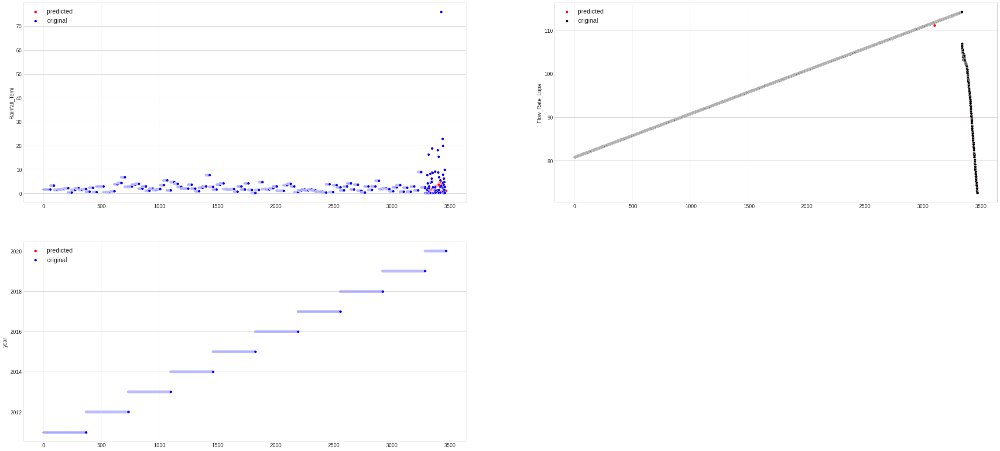

Dataset for imputation - Water_Spring_Madonna_di_Canneto


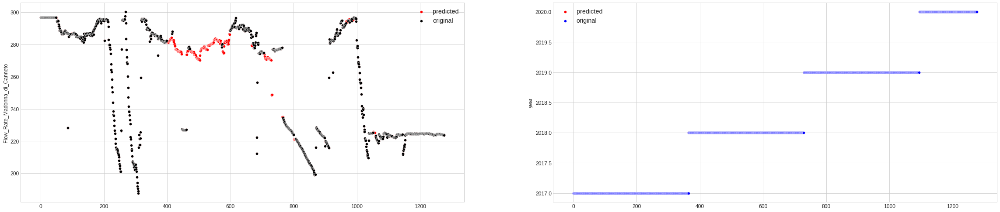

In [30]:
for i,(name,acea_df,acea_df_target) in enumerate(zip(dataset,all_data,all_data_target)):
    print("Dataset for imputation - " + str(name))
    acea_df.reset_index(inplace = True, drop = True) 
    all_data[i] = data_impute(acea_df,acea_df_target)

Remove date and month columns from all datasets because it is not needed for prediction.

In [31]:
for i,(acea_df,year) in enumerate(zip(all_data,year_to_select)):
  try:
        all_data[i].drop(['Date','month'],axis=1,inplace=True)
  except:
        all_data[i].drop(['Date'],axis=1,inplace=True)

In [32]:
Stationarity Test

SyntaxError: ignored

Using non-stationary time series data in forecasting models produces unreliable and spurious results that leads to poor understanding and forecasting. The solution to the problem is to transform the time series data so that it becomes stationary. ADF and KPSS are quick stationary statistical tests to understand the data you are dealing with. Most statistical forecasting methods are based on the assumption that the time series are approximately stationary. A stationary series is relatively easy to predict: you simply forecast that its statistical properties will be the same in the future as they have been in the past. Analysis of time series patterns is the first step of converting non-stationary data in to stationary data (for example by trend removal), so that the statistical forecasting methods could be applied. There are three fundamental steps of building a quality forecasting time series model: making the data stationary, selecting the right model, and evaluating model accuracy.

Augmented Dickey-Fuller (ADF) test is a type of statistical test called a unit root test. Unit roots are a cause for non-stationarity.

Null Hypothesis (H0): Time series has a unit root. (Time series is not stationary).

Alternate Hypothesis (H1): Time series has no unit root (Time series is stationary).

If the null hypothesis can be rejected, we can conclude that the time series is stationary.

There are two ways to rejects the null hypothesis:

On the one hand, the null hypothesis can be rejected if the p-value is below a set significance level. The defaults significance level is 5%

p-value > significance level (default: 0.05): Fail to reject the null hypothesis (H0), the data has a unit root and is non-stationary. p-value <= significance level (default: 0.05): Reject the null hypothesis (H0), the data does not have a unit root and is stationary. On the other hand, the null hypothesis can be rejects if the test statistic is less than the critical value.

ADF statistic > critical value: Fail to reject the null hypothesis (H0), the data has a unit root and is non-stationary. ADF statistic < critical value: Reject the null hypothesis (H0), the data does not have a unit root and is stationary.



In [ ]:
from statsmodels.tsa.stattools import adfuller

for i,col in enumerate(all_data[0].columns):
    plt.figure(figsize=(60,20))
    if col=='Date':
      continue
    series = all_data[0][col].values
    i=1
    result = adfuller(series)
    significance_level = 0.05
    adf_stat = result[0]
    p_val = result[1]
    crit_val_1 = result[4]['1%']
    crit_val_5 = result[4]['5%']
    crit_val_10 = result[4]['10%']

    if (p_val < significance_level) & ((adf_stat < crit_val_1)):
        linecolor = 'forestgreen' 
    elif (p_val < significance_level) & (adf_stat < crit_val_5):
        linecolor = 'gold'
    elif (p_val < significance_level) & (adf_stat < crit_val_10):
        linecolor = 'orange'
    else:
        linecolor = 'indianred'

    plt.subplot(10,3,i)
    plt.plot(series, color=linecolor)
    i=i+1
    plt.title(f'ADF Statistic {adf_stat:0.3f}, p-value: {p_val:0.3f}\nCritical Values 1%: {crit_val_1:0.3f}, 5%: {crit_val_5:0.3f}, 10%: {crit_val_10:0.3f}', fontsize=14)
    plt.ylabel(ylabel=str(col), fontsize=14)
    plt.show()

Stationarity Test for Aquifer_doganella

In [ ]:
from statsmodels.tsa.stattools import adfuller

for i,col in enumerate(all_data[1].columns):
    plt.figure(figsize=(60,20))
    if col=='Date':
      continue
    series = all_data[1][col].values
    i=1
    result = adfuller(series)
    significance_level = 0.05
    adf_stat = result[0]
    p_val = result[1]
    crit_val_1 = result[4]['1%']
    crit_val_5 = result[4]['5%']
    crit_val_10 = result[4]['10%']

    if (p_val < significance_level) & ((adf_stat < crit_val_1)):
        linecolor = 'forestgreen' 
    elif (p_val < significance_level) & (adf_stat < crit_val_5):
        linecolor = 'gold'
    elif (p_val < significance_level) & (adf_stat < crit_val_10):
        linecolor = 'orange'
    else:
        linecolor = 'indianred'

    plt.subplot(10,3,i)
    plt.plot(series, color=linecolor)
    i=i+1
    plt.title(f'ADF Statistic {adf_stat:0.3f}, p-value: {p_val:0.3f}\nCritical Values 1%: {crit_val_1:0.3f}, 5%: {crit_val_5:0.3f}, 10%: {crit_val_10:0.3f}', fontsize=14)
    plt.ylabel(ylabel=str(col), fontsize=14)
plt.show()

Stationarity Test for Aquifer_luco



In [ ]:
from statsmodels.tsa.stattools import adfuller

for i,col in enumerate(all_data[2].columns):
    plt.figure(figsize=(60,20))
    if col=='Date':
      continue
    series = all_data[2][col].values
    i=1
    result = adfuller(series)
    significance_level = 0.05
    adf_stat = result[0]
    p_val = result[1]
    crit_val_1 = result[4]['1%']
    crit_val_5 = result[4]['5%']
    crit_val_10 = result[4]['10%']

    if (p_val < significance_level) & ((adf_stat < crit_val_1)):
        linecolor = 'forestgreen' 
    elif (p_val < significance_level) & (adf_stat < crit_val_5):
        linecolor = 'gold'
    elif (p_val < significance_level) & (adf_stat < crit_val_10):
        linecolor = 'orange'
    else:
        linecolor = 'indianred'

    plt.subplot(10,3,i)
    plt.plot(series, color=linecolor)
    i=i+1
    plt.title(f'ADF Statistic {adf_stat:0.3f}, p-value: {p_val:0.3f}\nCritical Values 1%: {crit_val_1:0.3f}, 5%: {crit_val_5:0.3f}, 10%: {crit_val_10:0.3f}', fontsize=14)
    plt.ylabel(ylabel=str(col), fontsize=14)
    plt.show()


Stationarity Test for Aquifer_patrignano

In [ ]:
from statsmodels.tsa.stattools import adfuller

for i,col in enumerate(all_data[3].columns):
    plt.figure(figsize=(60,20))
    if col=='Date':
      continue
    series = all_data[3][col].values
    i=1
    result = adfuller(series)
    significance_level = 0.05
    adf_stat = result[0]
    p_val = result[1]
    crit_val_1 = result[4]['1%']
    crit_val_5 = result[4]['5%']
    crit_val_10 = result[4]['10%']

    if (p_val < significance_level) & ((adf_stat < crit_val_1)):
        linecolor = 'forestgreen' 
    elif (p_val < significance_level) & (adf_stat < crit_val_5):
        linecolor = 'gold'
    elif (p_val < significance_level) & (adf_stat < crit_val_10):
        linecolor = 'orange'
    else:
        linecolor = 'indianred'

    plt.subplot(10,3,i)
    plt.plot(series, color=linecolor)
    i=i+1
    plt.title(f'ADF Statistic {adf_stat:0.3f}, p-value: {p_val:0.3f}\nCritical Values 1%: {crit_val_1:0.3f}, 5%: {crit_val_5:0.3f}, 10%: {crit_val_10:0.3f}', fontsize=14)
    plt.ylabel(ylabel=str(col), fontsize=14)
    plt.show()


Stationarity Test for Lake_Bilancino

In [ ]:
from statsmodels.tsa.stattools import adfuller

for i,col in enumerate(all_data[4].columns):
    plt.figure(figsize=(60,20))
    if col=='Date':
      continue
    series = all_data[4][col].values
    i=1
    result = adfuller(series)
    significance_level = 0.05
    adf_stat = result[0]
    p_val = result[1]
    crit_val_1 = result[4]['1%']
    crit_val_5 = result[4]['5%']
    crit_val_10 = result[4]['10%']

    if (p_val < significance_level) & ((adf_stat < crit_val_1)):
        linecolor = 'forestgreen' 
    elif (p_val < significance_level) & (adf_stat < crit_val_5):
        linecolor = 'gold'
    elif (p_val < significance_level) & (adf_stat < crit_val_10):
        linecolor = 'orange'
    else:
        linecolor = 'indianred'

    plt.subplot(10,3,i)
    plt.plot(series, color=linecolor)
    i=i+1
    plt.title(f'ADF Statistic {adf_stat:0.3f}, p-value: {p_val:0.3f}\nCritical Values 1%: {crit_val_1:0.3f}, 5%: {crit_val_5:0.3f}, 10%: {crit_val_10:0.3f}', fontsize=14)
    plt.ylabel(ylabel=str(col), fontsize=14)
    plt.show()


Stationarity Test for River_arno



In [ ]:
from statsmodels.tsa.stattools import adfuller

for i,col in enumerate(all_data[5].columns):
    plt.figure(figsize=(60,20))
    if col=='Date':
      continue
    series = all_data[5][col].values
    i=1
    result = adfuller(series)
    significance_level = 0.05
    adf_stat = result[0]
    p_val = result[1]
    crit_val_1 = result[4]['1%']
    crit_val_5 = result[4]['5%']
    crit_val_10 = result[4]['10%']

    if (p_val < significance_level) & ((adf_stat < crit_val_1)):
        linecolor = 'forestgreen' 
    elif (p_val < significance_level) & (adf_stat < crit_val_5):
        linecolor = 'gold'
    elif (p_val < significance_level) & (adf_stat < crit_val_10):
        linecolor = 'orange'
    else:
        linecolor = 'indianred'

    plt.subplot(10,3,i)
    plt.plot(series, color=linecolor)
    i=i+1
    plt.title(f'ADF Statistic {adf_stat:0.3f}, p-value: {p_val:0.3f}\nCritical Values 1%: {crit_val_1:0.3f}, 5%: {crit_val_5:0.3f}, 10%: {crit_val_10:0.3f}', fontsize=14)
    plt.ylabel(ylabel=str(col), fontsize=14)
    plt.show()


Stationarity Test for Water_Spring_Amiata



In [ ]:
from statsmodels.tsa.stattools import adfuller

for i,col in enumerate(all_data[6].columns):
    plt.figure(figsize=(60,20))
    if col=='Date':
      continue
    series = all_data[6][col].values
    i=1
    result = adfuller(series)
    significance_level = 0.05
    adf_stat = result[0]
    p_val = result[1]
    crit_val_1 = result[4]['1%']
    crit_val_5 = result[4]['5%']
    crit_val_10 = result[4]['10%']

    if (p_val < significance_level) & ((adf_stat < crit_val_1)):
        linecolor = 'forestgreen' 
    elif (p_val < significance_level) & (adf_stat < crit_val_5):
        linecolor = 'gold'
    elif (p_val < significance_level) & (adf_stat < crit_val_10):
        linecolor = 'orange'
    else:
        linecolor = 'indianred'

    plt.subplot(10,3,i)
    plt.plot(series, color=linecolor)
    i=i+1
    plt.title(f'ADF Statistic {adf_stat:0.3f}, p-value: {p_val:0.3f}\nCritical Values 1%: {crit_val_1:0.3f}, 5%: {crit_val_5:0.3f}, 10%: {crit_val_10:0.3f}', fontsize=14)
    plt.ylabel(ylabel=str(col), fontsize=14)
    plt.show()




```
Stationarity Test for Water_spring_lupa

```



In [ ]:
from statsmodels.tsa.stattools import adfuller

for i,col in enumerate(all_data[7].columns):
    plt.figure(figsize=(60,20))
    if col=='Date':
      continue
    series = all_data[7][col].values
    i=1
    result = adfuller(series)
    significance_level = 0.05
    adf_stat = result[0]
    p_val = result[1]
    crit_val_1 = result[4]['1%']
    crit_val_5 = result[4]['5%']
    crit_val_10 = result[4]['10%']

    if (p_val < significance_level) & ((adf_stat < crit_val_1)):
        linecolor = 'forestgreen' 
    elif (p_val < significance_level) & (adf_stat < crit_val_5):
        linecolor = 'gold'
    elif (p_val < significance_level) & (adf_stat < crit_val_10):
        linecolor = 'orange'
    else:
        linecolor = 'indianred'

    plt.subplot(10,3,i)
    plt.plot(series, color=linecolor)
    i=i+1
    plt.title(f'ADF Statistic {adf_stat:0.3f}, p-value: {p_val:0.3f}\nCritical Values 1%: {crit_val_1:0.3f}, 5%: {crit_val_5:0.3f}, 10%: {crit_val_10:0.3f}', fontsize=14)
    plt.ylabel(ylabel=str(col), fontsize=14)
    plt.show()


Stationarity Test for Water_Spring_Madonna_di_Canneto



In [ ]:
from statsmodels.tsa.stattools import adfuller

for i,col in enumerate(all_data[8].columns):
    plt.figure(figsize=(60,20))
    if col=='Date':
      continue
    series = all_data[8][col].values
    i=1
    result = adfuller(series)
    significance_level = 0.05
    adf_stat = result[0]
    p_val = result[1]
    crit_val_1 = result[4]['1%']
    crit_val_5 = result[4]['5%']
    crit_val_10 = result[4]['10%']

    if (p_val < significance_level) & ((adf_stat < crit_val_1)):
        linecolor = 'forestgreen' 
    elif (p_val < significance_level) & (adf_stat < crit_val_5):
        linecolor = 'gold'
    elif (p_val < significance_level) & (adf_stat < crit_val_10):
        linecolor = 'orange'
    else:
        linecolor = 'indianred'

    plt.subplot(10,3,i)
    plt.plot(series, color=linecolor)
    i=i+1
    plt.title(f'ADF Statistic {adf_stat:0.3f}, p-value: {p_val:0.3f}\nCritical Values 1%: {crit_val_1:0.3f}, 5%: {crit_val_5:0.3f}, 10%: {crit_val_10:0.3f}', fontsize=14)
    plt.ylabel(ylabel=str(col), fontsize=14)
    plt.show()


# Feature Engineering

Creating Additional Features containing rolling averages.

image.png
Adding Features consiting of Rolling Average of 7 days for better model accuracy(smootherns dataset) whilst keeping original attributes.


In [ ]:
def add_feat(acea_df):
  i=0
  plt.figure(figsize=(40,100))
  for cols in acea_df.columns:
    acea_df[cols+'_roll'] = acea_df[cols].rolling(7).sum()
    plt.subplot(20,2, i+1)
    plt.plot(acea_df[cols+'_roll'])
    plt.title(str(cols)+'_roll') 
    i=i+1
  plt.show()
  acea_df.dropna(axis=0,inplace=True)
  return acea_df

for i,(name,acea_df,acea_df_target) in enumerate(zip(dataset,all_data,all_data_target)):
    print("Dataset for Feature Engineering - " + str(name))
    all_data[i] = add_feat(acea_df)

# LSTM

. Transforming Data set for multivariate LSTM model



In [ ]:
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
	n_vars = 1 if type(data) is list else data.shape[1]
	df = pd.DataFrame(data)
	cols, names = list(), list()
	# input sequence (t-n, ... t-1)
	for i in range(n_in, 0, -1):
		cols.append(df.shift(i))
		names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
	# forecast sequence (t, t+1, ... t+n)
	for i in range(0, n_out):
		cols.append(df.shift(-i))
		if i == 0:
			names += [('var%d(t)' % (j+1)) for j in range(n_vars)]
		else:
			names += [('var%d(t+%d)' % (j+1, i)) for j in range(n_vars)]
	# put it all together
	agg = pd.concat(cols, axis=1)
	agg.columns = names
	# drop rows with NaN values
	if dropnan:
		agg.dropna(inplace=True)
	return agg

Model



In [ ]:
def get_model(trainX):
        model = Sequential()
        model.add(LSTM(128, activation='relu',return_sequences=True, input_shape=(trainX.shape[1], trainX.shape[2])))
        model.add(Dropout(0.4))
        model.add(LSTM(64, activation='relu',return_sequences=True))
        model.add(Dropout(0.3))
        model.add(Dense(50))
        model.add(LSTM(32, activation='relu'))
        model.add(Dropout(0.3))
        model.add(Dense(1))
        model.compile(loss='mean_squared_error', optimizer='adam')
        #print(model.summary())
        return model

Forecasting Function

In [ ]:
def forecast(name,acea_df,acea_df_target):
    dataset = acea_df.copy()
    values = dataset.values
    # ensure all data is float
    values = values.astype('float32')
    # normalize features
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled = scaler.fit_transform(values)
    
    # frame as supervised learning
    reframed = series_to_supervised(scaled, 1, 1)
    # drop columns we don't want to predict
    cols_to_drop = [len(acea_df.columns) + acea_df.columns.get_loc(c) for c in acea_df if c not in acea_df_target]
    reframed.drop(reframed.columns[cols_to_drop], axis=1, inplace=True)
    values = reframed.values


    #Train Test Split
    train_size = int(len(values) * 0.7)
    test_size = len(values) - train_size

    train, test = values[0:train_size,:], values[train_size:len(values),:]
    scale = MinMaxScaler(feature_range=(0, 1))
    scale.min_,scale.scale_ = scaler.min_[0],scaler.scale_[0]

    for i in range(1,len(acea_df.columns)-len(cols_to_drop)+1):
        trainX, trainY = train[:, :len(acea_df.columns)], train[:, -i]
        testX, testY = test[:, :len(acea_df.columns)], test[:, -i]

        trainX = trainX.reshape((trainX.shape[0], 1, trainX.shape[1]))
        testX = testX.reshape((testX.shape[0], 1, testX.shape[1]))

        model = get_model(trainX)
        grads = gradient_importance(trainX, model)
        print('Mean:', np.mean(grads))
        print('Standard Deviation:', np.std(grads))

        plt.figure(figsize=(30,40))
        plt.subplot(12,3,3)  
        plt.bar(acea_df.columns,grads)
        plt.xticks(acea_df.columns, rotation=90)
        plt.legend()
        """       
        #|
        idx = np.nonzero((abs(grads) > 0.04))
        print("Selected Features - " + str(idx))

        foo = trainX[:,:,idx]
        trainX = np.squeeze(foo, axis=(1,))
        foo = testX[:,:,idx]
        testX = np.squeeze(foo, axis=(1,))
        """
        history = model.fit(trainX, trainY, epochs=100, batch_size=64, validation_data=(testX, testY), verbose=0, shuffle=False)
        
        yhat = model.predict(testX)
        testX = testX.reshape((testX.shape[0], testX.shape[2]))

        inv_yhat = np.concatenate((yhat, testX[:, 1:]), axis=1)
        inv_yhat = scale.inverse_transform(inv_yhat)
        inv_yhat = inv_yhat[:,0]

        testY = testY.reshape((len(testY), 1))
        inv_y = np.concatenate((testY, testX[:, 1:]), axis=1)
        inv_y = scale.inverse_transform(inv_y)
        inv_y = inv_y[:,0]

        rmse = math.sqrt(mean_squared_error(inv_y, inv_yhat))
        mae = mean_absolute_error(inv_y, inv_yhat)
        print('Test RMSE: %.3f' % rmse)
        print('Test MAE: %.3f' % mae)
      
        plt.subplot(12,3,1)        
        sns.scatterplot(x=np.linspace(0,len(inv_y),num=len(inv_y)), y=inv_y, color='black',label='Actual')
        sns.scatterplot(x=np.linspace(0,len(inv_yhat),num=len(inv_yhat)), y=inv_yhat, color='green',label='predicted')
        plt.title(acea_df_target[i-1])
        plt.legend()
       
        plt.subplot(12,3,2)
        plt.plot(history.history['loss'], label='train')
        plt.plot(history.history['val_loss'], label='test')
        plt.legend()
        
        actual.append(inv_y)
        predicted.append(inv_yhat)
        targets.append(acea_df_target[i-1])
        rmses.append(rmse)
        maes.append(mae)
        
    plt.show()
    return actual,predicted,targets,history,rmses,maes



**Create feature importance plot**

Generally, importance provides a score that indicates how useful or valuable each feature was in the construction of the model.

The more an attribute is used to make key decisions, the higher its relative importance.

This importance is calculated explicitly for each attribute in the dataset, allowing attributes to be ranked and compared to each other.

In [ ]:
def gradient_importance(seq, model):
    seq = tf.Variable(seq, dtype=tf.float32)
    with tf.GradientTape() as tape:
        predictions = model(seq)
    grads = tape.gradient(predictions, seq)
    grads = tf.reduce_mean(grads, axis=1).numpy()[0]
    return grads

In [ ]:
actual = []
predicted = []
targets = []
rmses = []
maes = []
maes_train = []
rmses_train = []
for name,acea_df,acea_df_target in zip(dataset,all_data,all_data_target):
  actual,predicted,targets,history,rmses,maes= forecast(name,acea_df,acea_df_target)

# RMSE & MAE analysis

In [ ]:
errors = pd.DataFrame(list(zip(rmses, maes)), 
                      index=all_targets, columns=['Test RMSE','Test MAE'])
#errors.to_csv('error.csv')
errors

PLOT PREDICTIONS

In [ ]:
plt.figure(figsize=(40,200))
for i,(act,pred,name) in enumerate(zip(actual,predicted,targets)):
  plt.subplot(20,2,i+1)
  sns.scatterplot(x=np.linspace(0,len(act),num=len(act)), y=act, color='black',label='Actual')
  sns.scatterplot(x=np.linspace(0,len(pred),num=len(pred)), y=pred, color='green',label='predicted')
  plt.title(name)
  plt.legend()
plt.show()

As most of the target attributes of our datasets are non-stationary in nature ARIMA model is not feasible. So, Multivariate LSTM model was used.
LSTM outperforms the other models when we want our model to learn from long term dependencies.
LSTM's ability to forget, remember and update the information pushes it one step ahead of RNNs.
The system integrates the task of developing a LSTM model from data, with the technique of searching for logical conditions that enable a better fitting error by the model.
We think that the provided methodology is also applicable on new datasets belonging to another waterbody.